In [1]:
field = 'F7'
max_zoi = 100

In [2]:
# Parameters
field = "NW"


# 6: With the domains, sum the flux within the region boundaries

In [3]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from astropy.io import fits
from tqdm import tqdm
import os
from scipy.ndimage import binary_dilation


In [4]:
def region_edge_ring(region_mask, iterations=1):
    """
    Build an *outer edge ring* just outside the region boundary.

    Exactly:
    - Take region_mask (True inside region)
    - Dilate it by `iterations` pixels
    - Outer ring = dilated_mask & (~region_mask)

    This produces a 1-pixel thick ring outside the region if iterations=1,
    thicker if iterations>1.
    """
    region_mask = np.asarray(region_mask, dtype=bool)
    dil = binary_dilation(region_mask, iterations=iterations)
    ring = dil & (~region_mask)
    return ring

def integrated_flux_and_snr(flux, err, region_mask, ring_mask=None, clip_negative_after_bg=False):
    """
    Compute integrated flux and SNR for a region.

    Definitions used (exact):
    1) Raw integrated flux:
       F_raw = sum_i flux_i  over pixels i inside region_mask

    2) Integrated uncertainty (assuming per-pixel errors are 1-sigma and independent):
       sigma_F = sqrt( sum_i err_i^2 )   over pixels i inside region_mask

    3) Raw SNR:
       SNR_sum = F_raw / sigma_F   (if sigma_F>0 else NaN)

    Background subtraction (if ring_mask provided):
    4) Background level per pixel:
       b = mean_j flux_j over pixels j in ring_mask
       (with NaN-safe mean)

    5) Background-subtracted integrated flux:
       F_bgsub = sum_i (flux_i - b) over region pixels
              = F_raw - b * Npix_region

       Uncertainty remains:
       sigma_F_bgsub = sigma_F
       (i.e., we *do not* add uncertainty from estimating b; if you want that,
        we can include it, but this is the simplest standard approach.)

    6) Background-subtracted SNR:
       SNR_bgsub = F_bgsub / sigma_F  (if sigma_F>0 else NaN)

    Options:
    - clip_negative_after_bg: if True, clip (flux_i - b) at 0 before summing.
      (Default False = physically allows negative after subtraction.)
    """
    flux = np.asarray(flux, dtype=float)
    err  = np.asarray(err, dtype=float)

    inside = region_mask
    f_vals = flux[inside]
    e_vals = err[inside]

    # NaN handling: ignore NaNs in flux; but for error we must also ignore same pixels
    good = np.isfinite(f_vals) & np.isfinite(e_vals)
    f_vals = f_vals[good]
    e_vals = e_vals[good]

    npix = f_vals.size
    if npix == 0:
        return dict(
            npix=0,
            F_raw=np.nan, sigma_F=np.nan, SNR_raw=np.nan,
            b_edge=np.nan, F_bgsub=np.nan, SNR_bgsub=np.nan
        )

    F_raw = np.sum(f_vals)
    sigma_F = np.sqrt(np.sum(e_vals**2))
    SNR_raw = F_raw / sigma_F if sigma_F > 0 else np.nan

    b_edge = np.nan
    F_bgsub = np.nan
    SNR_bgsub = np.nan

    if ring_mask is not None:
        ring_vals = flux[ring_mask]
        ring_vals = ring_vals[np.isfinite(ring_vals)]
        b_edge = np.nanmean(ring_vals) if ring_vals.size > 0 else np.nan

        # background subtract
        if np.isfinite(b_edge):
            if clip_negative_after_bg:
                F_bgsub = np.sum(np.clip(f_vals - b_edge, 0, None))
            else:
                F_bgsub = np.sum(f_vals - b_edge)

            SNR_bgsub = F_bgsub / sigma_F if sigma_F > 0 else np.nan
        else:
            F_bgsub = np.nan
            SNR_bgsub = np.nan

    return dict(
        npix=npix,
        F_raw=F_raw,
        sigma_F=sigma_F,
        SNR_raw=SNR_raw,
        b_edge=b_edge,
        # F_bgsub=F_bgsub,
        # SNR_bgsub=SNR_bgsub
    )

def merge_check_duplicates(left_df, right_df, on, how="left", suffixes=("_x", "_y"), rtol=0, atol=0):
    """
    Merge and resolve duplicate columns:
    - If a column name exists in both (excluding key columns), compare values.
    - If all equal within tolerance -> keep one.
    - If not equal -> keep both with suffixes.

    This expects 'on' to be a list or string key(s).
    """
    if isinstance(on, str):
        on = [on]

    overlap = (set(left_df.columns) & set(right_df.columns)) - set(on)
    merged = left_df.merge(right_df, on=on, how=how, suffixes=suffixes)

    for col in overlap:
        cx = f"{col}{suffixes[0]}"
        cy = f"{col}{suffixes[1]}"
        if cx in merged.columns and cy in merged.columns:
            a = merged[cx].to_numpy()
            b = merged[cy].to_numpy()

            # treat NaNs as equal where both NaN
            both_nan = np.isnan(a) & np.isnan(b) if (np.issubdtype(a.dtype, np.number) and np.issubdtype(b.dtype, np.number)) else np.zeros_like(a, dtype=bool)

            equal = False
            if np.issubdtype(a.dtype, np.number) and np.issubdtype(b.dtype, np.number):
                equal = np.allclose(a[~both_nan], b[~both_nan], rtol=rtol, atol=atol, equal_nan=True)
            else:
                equal = np.all((a == b) | (pd.isna(a) & pd.isna(b)))

            if equal:
                merged[col] = merged[cx]
                merged.drop(columns=[cx, cy], inplace=True)
            else:
                # keep both; do nothing
                pass

    return merged

In [5]:
folder = f"../M33-Maps-Calibrated/M33-{field}/"

def read_fits(path):
    hdul = fits.open(path)
    data = hdul[0].data
    header = hdul[0].header
    hdul.close()
    return data, header

ha_flux_data, ha_flux_header = read_fits(folder + f"M33{field}-Haflux.fits")
ha_flux_err_data, ha_flux_err_header = read_fits(folder + f"M33{field}-Haflux-err.fits")

hb_flux_data, hb_flux_header = read_fits(folder + f"M33{field}-Hbflux.fits")
hb_flux_err_data, hb_flux_err_header = read_fits(folder + f"M33{field}-Hbflux-err.fits")

oiii_flux_data, oiii_flux_header = read_fits(folder + f"M33{field}-OIII5007flux.fits")
oiii_flux_err_data, oiii_flux_err_header = read_fits(folder + f"M33{field}-OIII5007flux-err.fits")

sii6716_flux_data, sii6716_flux_header = read_fits(folder + f"M33{field}-SII6716flux.fits")
sii6716_flux_err_data, sii6716_flux_err_header = read_fits(folder + f"M33{field}-SII6716flux-err.fits")

sii6731_flux_data, sii6731_flux_header = read_fits(folder + f"M33{field}-SII6731flux.fits")
sii6731_flux_err_data, sii6731_flux_err_header = read_fits(folder + f"M33{field}-SII6731flux-err.fits")

nii6584_flux_data, nii6584_flux_header = read_fits(folder + f"M33{field}-NII6584flux.fits")
nii6584_flux_err_data, nii6584_flux_err_header = read_fits(folder + f"M33{field}-NII6584flux-err.fits")

oii3727_flux_data, oii3727_flux_header = read_fits(folder + f"M33{field}-OII3727flux.fits")
oii3727_flux_err_data, oii3727_flux_err_header = read_fits(folder + f"M33{field}-OII3727flux-err.fits")

# Load peak list, zoi, boundary maps
peaks_csv     = f"CATALOGS/final_peaks_{field}.csv"
peaks_df      = pd.read_csv(peaks_csv, comment="#")

zoi_fits = f"ZOI_maps/ZOI_map_{max_zoi}pc/ZoI_map_{field}.fits"
zoi_map = fits.open(zoi_fits)[0].data

boundary_fits = f"Boundary_maps/Boundary_map_100pc/Boundary_map_{field}.fits"
boundary_map = fits.open(boundary_fits)[0].data

boundary_metric_csv = f"Boundary_maps/Boundary_map_100pc/Boundary_metrics_{field}.csv"
boundary_metric_df = pd.read_csv(boundary_metric_csv)


int_flux_ascii = f"CATALOGS/fit_int_spec/{field}_Data_flux.ascii" 
#this is the actual integrated fluxes from the cube, but if some cubes have issues, in this notebook we also just sum the flux initially, and I'll get proper integrated flux later...
try:
    int_flux_df = pd.read_csv(int_flux_ascii, delim_whitespace=True, comment="#")
    # sort by 'id' column
    int_flux_df.sort_values(by='id', inplace=True)
    # check if any id number is missing, if so, replace with a Nan row
    expected_ids = set(range(0, len(peaks_df)))
    actual_ids = set(int_flux_df['id'])
    missing_ids = expected_ids - actual_ids
    for mid in missing_ids:
        int_flux_df = pd.concat([int_flux_df, pd.DataFrame({'id': [mid], 'int_flux': [np.nan]})], ignore_index=True)
    int_flux_df.sort_values(by='id', inplace=True)
    
except FileNotFoundError:
    print(f"Warning: {int_flux_ascii} not found. Continuing without it.")
    
    #make it an empty dataframe with the same column names as the int_flux_ascii from the SW field
    int_flux_SW = pd.read_csv(f"CATALOGS/fit_int_spec/SW_Data_flux.ascii", delim_whitespace=True, comment="#")
    int_flux_df = pd.DataFrame(columns=int_flux_SW.columns)
    
#change column names in int_flux_df to have a _int

for col in int_flux_df.columns:
    int_flux_df.rename(columns={col: f"{col}_int"}, inplace=True)


/var/folders/90/nb83zn5j00bc53x6bcv0jcwm0000gn/T/ipykernel_38603/1788187881.py:48: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  int_flux_df = pd.read_csv(int_flux_ascii, delim_whitespace=True, comment="#")


In [6]:
print(len(boundary_metric_df) == len(peaks_df) == len(int_flux_df))

True


In [7]:
# Put your flux and error maps in a dict for looping
maps = {
    "Halpha":      (ha_flux_data, ha_flux_err_data),
    "Hbeta":      (hb_flux_data, hb_flux_err_data),
    "[OIII]5007":(oiii_flux_data, oiii_flux_err_data),
    "[SII]6716": (sii6716_flux_data, sii6716_flux_err_data),
    "[SII]6731": (sii6731_flux_data, sii6731_flux_err_data),
    "[NII]6583": (nii6584_flux_data, nii6584_flux_err_data),
    "[OII]3727": (oii3727_flux_data, oii3727_flux_err_data),
}

# Region labels present in boundary_map (ignore 0, NaNs)
labels = np.unique(boundary_map[np.isfinite(boundary_map)])
labels = labels[labels > 0].astype(int)

print(f"Found {len(labels)} regions (labels > 0). Min={labels.min() if len(labels) else None}, Max={labels.max() if len(labels) else None}")

Found 1118 regions (labels > 0). Min=1, Max=1118


In [8]:
# Parameters you can tune:
edge_ring_iterations = 1          # thickness of outer ring (pixels)
clip_negative_after_bg = False    # True if you want to force bgsub flux >= 0 per pixel

rows = []

for rid in tqdm(labels, desc="Processing regions"):
    region_mask = (boundary_map == rid)
    ring_mask = region_edge_ring(region_mask, iterations=edge_ring_iterations)

    row = {
        "region_id": rid,
        "npix_region": int(np.sum(region_mask)),
        "npix_edge_ring": int(np.sum(ring_mask)),
    }

    # # optional: store a region-wide average ZoI value (or something else)
    # if 'zoi_map' in globals() and zoi_map is not None:
    #     zvals = zoi_map[region_mask]
    #     zvals = zvals[np.isfinite(zvals)]
    #     row["zoi_mean"] = float(np.nanmean(zvals)) if zvals.size else np.nan
    #     row["zoi_median"] = float(np.nanmedian(zvals)) if zvals.size else np.nan
    # else:
    #     row["zoi_mean"] = np.nan
    #     row["zoi_median"] = np.nan

    for name, (flux, err) in maps.items():
        stats = integrated_flux_and_snr(
            flux=flux,
            err=err,
            region_mask=region_mask,
            ring_mask=ring_mask,
            clip_negative_after_bg=clip_negative_after_bg
        )

        # Write columns in a consistent naming scheme
        row[f"F_{name}_sum"]     = stats["F_raw"]
        row[f"F_{name}_e_sum"]   = stats["sigma_F"]
        row[f"SNR_{name}_sum"]   = stats["SNR_raw"]
        row[f"{name}_b_edge"]    = stats["b_edge"]
        # row[f"{name}_F_bgsub"]   = stats["F_bgsub"]
        # row[f"{name}_SNR_bgsub"] = stats["SNR_bgsub"]

    rows.append(row)

flux_catalog_df = pd.DataFrame(rows).sort_values("region_id").reset_index(drop=True)

flux_catalog_df.head()

Processing regions:   0%|                                                                                                                     | 0/1118 [00:00<?, ?it/s]

Processing regions:   0%|                                                                                                             | 1/1118 [00:00<14:56,  1.25it/s]

Processing regions:   0%|▎                                                                                                            | 3/1118 [00:00<04:41,  3.97it/s]

Processing regions:   0%|▍                                                                                                            | 5/1118 [00:01<02:51,  6.51it/s]

Processing regions:   1%|▋                                                                                                            | 7/1118 [00:01<02:05,  8.84it/s]

Processing regions:   1%|▉                                                                                                            | 9/1118 [00:01<01:44, 10.59it/s]

Processing regions:   1%|█                                                                                                           | 11/1118 [00:01<01:32, 11.91it/s]

Processing regions:   1%|█▎                                                                                                          | 13/1118 [00:01<01:24, 13.09it/s]

Processing regions:   1%|█▍                                                                                                          | 15/1118 [00:01<01:19, 13.91it/s]

Processing regions:   2%|█▋                                                                                                          | 17/1118 [00:01<01:15, 14.51it/s]

Processing regions:   2%|█▊                                                                                                          | 19/1118 [00:01<01:12, 15.11it/s]

Processing regions:   2%|██                                                                                                          | 21/1118 [00:02<01:10, 15.63it/s]

Processing regions:   2%|██▏                                                                                                         | 23/1118 [00:02<01:08, 15.89it/s]

Processing regions:   2%|██▍                                                                                                         | 25/1118 [00:02<01:09, 15.74it/s]

Processing regions:   2%|██▌                                                                                                         | 27/1118 [00:02<01:08, 15.91it/s]

Processing regions:   3%|██▊                                                                                                         | 29/1118 [00:02<01:06, 16.32it/s]

Processing regions:   3%|██▉                                                                                                         | 31/1118 [00:02<01:05, 16.63it/s]

Processing regions:   3%|███▏                                                                                                        | 33/1118 [00:02<01:04, 16.78it/s]

Processing regions:   3%|███▍                                                                                                        | 35/1118 [00:02<01:04, 16.92it/s]

Processing regions:   3%|███▌                                                                                                        | 37/1118 [00:02<01:04, 16.82it/s]

Processing regions:   3%|███▊                                                                                                        | 39/1118 [00:03<01:03, 16.87it/s]

Processing regions:   4%|███▉                                                                                                        | 41/1118 [00:03<01:05, 16.38it/s]

Processing regions:   4%|████▏                                                                                                       | 43/1118 [00:03<01:05, 16.32it/s]

Processing regions:   4%|████▎                                                                                                       | 45/1118 [00:03<01:05, 16.38it/s]

Processing regions:   4%|████▌                                                                                                       | 47/1118 [00:03<01:05, 16.23it/s]

Processing regions:   4%|████▋                                                                                                       | 49/1118 [00:03<01:06, 16.18it/s]

Processing regions:   5%|████▉                                                                                                       | 51/1118 [00:03<01:05, 16.27it/s]

Processing regions:   5%|█████                                                                                                       | 53/1118 [00:03<01:04, 16.44it/s]

Processing regions:   5%|█████▎                                                                                                      | 55/1118 [00:04<01:06, 15.87it/s]

Processing regions:   5%|█████▌                                                                                                      | 57/1118 [00:04<01:05, 16.16it/s]

Processing regions:   5%|█████▋                                                                                                      | 59/1118 [00:04<01:05, 16.09it/s]

Processing regions:   5%|█████▉                                                                                                      | 61/1118 [00:04<01:06, 15.79it/s]

Processing regions:   6%|██████                                                                                                      | 63/1118 [00:04<01:06, 15.85it/s]

Processing regions:   6%|██████▎                                                                                                     | 65/1118 [00:04<01:05, 16.01it/s]

Processing regions:   6%|██████▍                                                                                                     | 67/1118 [00:04<01:05, 16.15it/s]

Processing regions:   6%|██████▋                                                                                                     | 69/1118 [00:04<01:03, 16.41it/s]

Processing regions:   6%|██████▊                                                                                                     | 71/1118 [00:05<01:02, 16.65it/s]

Processing regions:   7%|███████                                                                                                     | 73/1118 [00:05<01:01, 16.86it/s]

Processing regions:   7%|███████▏                                                                                                    | 75/1118 [00:05<01:02, 16.82it/s]

Processing regions:   7%|███████▍                                                                                                    | 77/1118 [00:05<01:04, 16.07it/s]

Processing regions:   7%|███████▋                                                                                                    | 79/1118 [00:05<01:04, 16.13it/s]

Processing regions:   7%|███████▊                                                                                                    | 81/1118 [00:05<01:02, 16.47it/s]

Processing regions:   7%|████████                                                                                                    | 83/1118 [00:05<01:01, 16.72it/s]

Processing regions:   8%|████████▏                                                                                                   | 85/1118 [00:05<01:00, 16.94it/s]

Processing regions:   8%|████████▍                                                                                                   | 87/1118 [00:06<01:02, 16.55it/s]

Processing regions:   8%|████████▌                                                                                                   | 89/1118 [00:06<01:04, 16.04it/s]

Processing regions:   8%|████████▊                                                                                                   | 91/1118 [00:06<01:03, 16.15it/s]

Processing regions:   8%|████████▉                                                                                                   | 93/1118 [00:06<01:02, 16.29it/s]

Processing regions:   8%|█████████▏                                                                                                  | 95/1118 [00:06<01:02, 16.44it/s]

Processing regions:   9%|█████████▎                                                                                                  | 97/1118 [00:06<01:01, 16.56it/s]

Processing regions:   9%|█████████▌                                                                                                  | 99/1118 [00:06<01:01, 16.57it/s]

Processing regions:   9%|█████████▋                                                                                                 | 101/1118 [00:06<01:02, 16.19it/s]

Processing regions:   9%|█████████▊                                                                                                 | 103/1118 [00:07<01:01, 16.45it/s]

Processing regions:   9%|██████████                                                                                                 | 105/1118 [00:07<01:02, 16.33it/s]

Processing regions:  10%|██████████▏                                                                                                | 107/1118 [00:07<01:01, 16.37it/s]

Processing regions:  10%|██████████▍                                                                                                | 109/1118 [00:07<01:01, 16.29it/s]

Processing regions:  10%|██████████▌                                                                                                | 111/1118 [00:07<01:01, 16.35it/s]

Processing regions:  10%|██████████▊                                                                                                | 113/1118 [00:07<01:01, 16.22it/s]

Processing regions:  10%|███████████                                                                                                | 115/1118 [00:07<01:04, 15.66it/s]

Processing regions:  10%|███████████▏                                                                                               | 117/1118 [00:07<01:02, 16.09it/s]

Processing regions:  11%|███████████▍                                                                                               | 119/1118 [00:08<01:03, 15.77it/s]

Processing regions:  11%|███████████▌                                                                                               | 121/1118 [00:08<01:02, 16.01it/s]

Processing regions:  11%|███████████▊                                                                                               | 123/1118 [00:08<01:01, 16.25it/s]

Processing regions:  11%|███████████▉                                                                                               | 125/1118 [00:08<01:05, 15.13it/s]

Processing regions:  11%|████████████▏                                                                                              | 127/1118 [00:08<01:07, 14.79it/s]

Processing regions:  12%|████████████▎                                                                                              | 129/1118 [00:08<01:04, 15.36it/s]

Processing regions:  12%|████████████▌                                                                                              | 131/1118 [00:08<01:02, 15.87it/s]

Processing regions:  12%|████████████▋                                                                                              | 133/1118 [00:08<01:00, 16.36it/s]

Processing regions:  12%|████████████▉                                                                                              | 135/1118 [00:09<00:58, 16.74it/s]

Processing regions:  12%|█████████████                                                                                              | 137/1118 [00:09<00:57, 17.00it/s]

Processing regions:  12%|█████████████▎                                                                                             | 139/1118 [00:09<00:56, 17.20it/s]

Processing regions:  13%|█████████████▍                                                                                             | 141/1118 [00:09<00:57, 17.11it/s]

Processing regions:  13%|█████████████▋                                                                                             | 143/1118 [00:09<00:56, 17.25it/s]

Processing regions:  13%|█████████████▉                                                                                             | 145/1118 [00:09<00:56, 17.29it/s]

Processing regions:  13%|██████████████                                                                                             | 147/1118 [00:09<00:55, 17.40it/s]

Processing regions:  13%|██████████████▎                                                                                            | 149/1118 [00:09<00:55, 17.36it/s]

Processing regions:  14%|██████████████▍                                                                                            | 151/1118 [00:09<00:55, 17.46it/s]

Processing regions:  14%|██████████████▋                                                                                            | 153/1118 [00:10<00:57, 16.81it/s]

Processing regions:  14%|██████████████▊                                                                                            | 155/1118 [00:10<00:58, 16.58it/s]

Processing regions:  14%|███████████████                                                                                            | 157/1118 [00:10<00:57, 16.83it/s]

Processing regions:  14%|███████████████▏                                                                                           | 159/1118 [00:10<00:57, 16.81it/s]

Processing regions:  14%|███████████████▍                                                                                           | 161/1118 [00:10<00:56, 16.91it/s]

Processing regions:  15%|███████████████▌                                                                                           | 163/1118 [00:10<00:55, 17.08it/s]

Processing regions:  15%|███████████████▊                                                                                           | 165/1118 [00:10<00:55, 17.09it/s]

Processing regions:  15%|███████████████▉                                                                                           | 167/1118 [00:10<00:55, 17.23it/s]

Processing regions:  15%|████████████████▏                                                                                          | 169/1118 [00:11<00:54, 17.27it/s]

Processing regions:  15%|████████████████▎                                                                                          | 171/1118 [00:11<00:54, 17.24it/s]

Processing regions:  15%|████████████████▌                                                                                          | 173/1118 [00:11<00:54, 17.36it/s]

Processing regions:  16%|████████████████▋                                                                                          | 175/1118 [00:11<00:54, 17.43it/s]

Processing regions:  16%|████████████████▉                                                                                          | 177/1118 [00:11<00:53, 17.48it/s]

Processing regions:  16%|█████████████████▏                                                                                         | 179/1118 [00:11<00:53, 17.46it/s]

Processing regions:  16%|█████████████████▎                                                                                         | 181/1118 [00:11<00:54, 17.29it/s]

Processing regions:  16%|█████████████████▌                                                                                         | 183/1118 [00:11<00:54, 17.29it/s]

Processing regions:  17%|█████████████████▋                                                                                         | 185/1118 [00:11<00:53, 17.36it/s]

Processing regions:  17%|█████████████████▉                                                                                         | 187/1118 [00:12<00:53, 17.33it/s]

Processing regions:  17%|██████████████████                                                                                         | 189/1118 [00:12<00:54, 17.08it/s]

Processing regions:  17%|██████████████████▎                                                                                        | 191/1118 [00:12<00:54, 17.04it/s]

Processing regions:  17%|██████████████████▍                                                                                        | 193/1118 [00:12<00:53, 17.14it/s]

Processing regions:  17%|██████████████████▋                                                                                        | 195/1118 [00:12<00:58, 15.89it/s]

Processing regions:  18%|██████████████████▊                                                                                        | 197/1118 [00:12<01:00, 15.11it/s]

Processing regions:  18%|███████████████████                                                                                        | 199/1118 [00:12<00:59, 15.44it/s]

Processing regions:  18%|███████████████████▏                                                                                       | 201/1118 [00:12<00:57, 15.95it/s]

Processing regions:  18%|███████████████████▍                                                                                       | 203/1118 [00:13<00:55, 16.41it/s]

Processing regions:  18%|███████████████████▌                                                                                       | 205/1118 [00:13<00:54, 16.77it/s]

Processing regions:  19%|███████████████████▊                                                                                       | 207/1118 [00:13<00:53, 16.99it/s]

Processing regions:  19%|████████████████████                                                                                       | 209/1118 [00:13<00:53, 17.14it/s]

Processing regions:  19%|████████████████████▏                                                                                      | 211/1118 [00:13<00:52, 17.28it/s]

Processing regions:  19%|████████████████████▍                                                                                      | 213/1118 [00:13<00:52, 17.31it/s]

Processing regions:  19%|████████████████████▌                                                                                      | 215/1118 [00:13<00:52, 17.19it/s]

Processing regions:  19%|████████████████████▊                                                                                      | 217/1118 [00:13<00:52, 17.09it/s]

Processing regions:  20%|████████████████████▉                                                                                      | 219/1118 [00:13<00:52, 17.21it/s]

Processing regions:  20%|█████████████████████▏                                                                                     | 221/1118 [00:14<00:54, 16.45it/s]

Processing regions:  20%|█████████████████████▎                                                                                     | 223/1118 [00:14<00:55, 16.26it/s]

Processing regions:  20%|█████████████████████▌                                                                                     | 225/1118 [00:14<00:54, 16.53it/s]

Processing regions:  20%|█████████████████████▋                                                                                     | 227/1118 [00:14<00:53, 16.65it/s]

Processing regions:  20%|█████████████████████▉                                                                                     | 229/1118 [00:14<00:52, 16.87it/s]

Processing regions:  21%|██████████████████████                                                                                     | 231/1118 [00:14<00:52, 16.97it/s]

Processing regions:  21%|██████████████████████▎                                                                                    | 233/1118 [00:14<00:51, 17.13it/s]

Processing regions:  21%|██████████████████████▍                                                                                    | 235/1118 [00:14<00:50, 17.34it/s]

Processing regions:  21%|██████████████████████▋                                                                                    | 237/1118 [00:15<00:50, 17.35it/s]

Processing regions:  21%|██████████████████████▊                                                                                    | 239/1118 [00:15<00:51, 17.15it/s]

Processing regions:  22%|███████████████████████                                                                                    | 241/1118 [00:15<00:51, 16.92it/s]

Processing regions:  22%|███████████████████████▎                                                                                   | 243/1118 [00:15<00:52, 16.79it/s]

Processing regions:  22%|███████████████████████▍                                                                                   | 245/1118 [00:15<00:52, 16.74it/s]

Processing regions:  22%|███████████████████████▋                                                                                   | 247/1118 [00:15<00:51, 16.89it/s]

Processing regions:  22%|███████████████████████▊                                                                                   | 249/1118 [00:15<00:50, 17.07it/s]

Processing regions:  22%|████████████████████████                                                                                   | 251/1118 [00:15<00:50, 17.15it/s]

Processing regions:  23%|████████████████████████▏                                                                                  | 253/1118 [00:15<00:51, 16.83it/s]

Processing regions:  23%|████████████████████████▍                                                                                  | 255/1118 [00:16<00:54, 15.90it/s]

Processing regions:  23%|████████████████████████▌                                                                                  | 257/1118 [00:16<00:54, 15.72it/s]

Processing regions:  23%|████████████████████████▊                                                                                  | 259/1118 [00:16<00:53, 16.20it/s]

Processing regions:  23%|████████████████████████▉                                                                                  | 261/1118 [00:16<00:51, 16.59it/s]

Processing regions:  24%|█████████████████████████▏                                                                                 | 263/1118 [00:16<00:54, 15.78it/s]

Processing regions:  24%|█████████████████████████▎                                                                                 | 265/1118 [00:16<00:54, 15.51it/s]

Processing regions:  24%|█████████████████████████▌                                                                                 | 267/1118 [00:16<00:53, 16.00it/s]

Processing regions:  24%|█████████████████████████▋                                                                                 | 269/1118 [00:16<00:51, 16.35it/s]

Processing regions:  24%|█████████████████████████▉                                                                                 | 271/1118 [00:17<00:53, 15.81it/s]

Processing regions:  24%|██████████████████████████▏                                                                                | 273/1118 [00:17<00:53, 15.90it/s]

Processing regions:  25%|██████████████████████████▎                                                                                | 275/1118 [00:17<00:55, 15.30it/s]

Processing regions:  25%|██████████████████████████▌                                                                                | 277/1118 [00:17<00:53, 15.58it/s]

Processing regions:  25%|██████████████████████████▋                                                                                | 279/1118 [00:17<00:52, 16.10it/s]

Processing regions:  25%|██████████████████████████▉                                                                                | 281/1118 [00:17<00:50, 16.57it/s]

Processing regions:  25%|███████████████████████████                                                                                | 283/1118 [00:17<00:49, 16.78it/s]

Processing regions:  25%|███████████████████████████▎                                                                               | 285/1118 [00:17<00:48, 17.02it/s]

Processing regions:  26%|███████████████████████████▍                                                                               | 287/1118 [00:18<00:48, 17.23it/s]

Processing regions:  26%|███████████████████████████▋                                                                               | 289/1118 [00:18<00:48, 17.03it/s]

Processing regions:  26%|███████████████████████████▊                                                                               | 291/1118 [00:18<00:48, 16.95it/s]

Processing regions:  26%|████████████████████████████                                                                               | 293/1118 [00:18<00:48, 16.97it/s]

Processing regions:  26%|████████████████████████████▏                                                                              | 295/1118 [00:18<00:48, 17.07it/s]

Processing regions:  27%|████████████████████████████▍                                                                              | 297/1118 [00:18<00:47, 17.15it/s]

Processing regions:  27%|████████████████████████████▌                                                                              | 299/1118 [00:18<00:48, 16.89it/s]

Processing regions:  27%|████████████████████████████▊                                                                              | 301/1118 [00:18<00:51, 15.86it/s]

Processing regions:  27%|████████████████████████████▉                                                                              | 303/1118 [00:19<00:51, 15.96it/s]

Processing regions:  27%|█████████████████████████████▏                                                                             | 305/1118 [00:19<00:50, 16.24it/s]

Processing regions:  27%|█████████████████████████████▍                                                                             | 307/1118 [00:19<00:48, 16.66it/s]

Processing regions:  28%|█████████████████████████████▌                                                                             | 309/1118 [00:19<00:51, 15.83it/s]

Processing regions:  28%|█████████████████████████████▊                                                                             | 311/1118 [00:19<00:52, 15.50it/s]

Processing regions:  28%|█████████████████████████████▉                                                                             | 313/1118 [00:19<00:50, 16.00it/s]

Processing regions:  28%|██████████████████████████████▏                                                                            | 315/1118 [00:19<00:48, 16.41it/s]

Processing regions:  28%|██████████████████████████████▎                                                                            | 317/1118 [00:19<00:47, 16.77it/s]

Processing regions:  29%|██████████████████████████████▌                                                                            | 319/1118 [00:20<00:47, 16.87it/s]

Processing regions:  29%|██████████████████████████████▋                                                                            | 321/1118 [00:20<00:46, 17.00it/s]

Processing regions:  29%|██████████████████████████████▉                                                                            | 323/1118 [00:20<00:46, 17.17it/s]

Processing regions:  29%|███████████████████████████████                                                                            | 325/1118 [00:20<00:45, 17.34it/s]

Processing regions:  29%|███████████████████████████████▎                                                                           | 327/1118 [00:20<00:45, 17.35it/s]

Processing regions:  29%|███████████████████████████████▍                                                                           | 329/1118 [00:20<00:46, 16.79it/s]

Processing regions:  30%|███████████████████████████████▋                                                                           | 331/1118 [00:20<00:46, 17.09it/s]

Processing regions:  30%|███████████████████████████████▊                                                                           | 333/1118 [00:20<00:46, 16.85it/s]

Processing regions:  30%|████████████████████████████████                                                                           | 335/1118 [00:20<00:45, 17.04it/s]

Processing regions:  30%|████████████████████████████████▎                                                                          | 337/1118 [00:21<00:45, 17.22it/s]

Processing regions:  30%|████████████████████████████████▍                                                                          | 339/1118 [00:21<00:45, 17.31it/s]

Processing regions:  31%|████████████████████████████████▋                                                                          | 341/1118 [00:21<00:44, 17.40it/s]

Processing regions:  31%|████████████████████████████████▊                                                                          | 343/1118 [00:21<00:44, 17.35it/s]

Processing regions:  31%|█████████████████████████████████                                                                          | 345/1118 [00:21<00:44, 17.45it/s]

Processing regions:  31%|█████████████████████████████████▏                                                                         | 347/1118 [00:21<00:44, 17.44it/s]

Processing regions:  31%|█████████████████████████████████▍                                                                         | 349/1118 [00:21<00:44, 17.33it/s]

Processing regions:  31%|█████████████████████████████████▌                                                                         | 351/1118 [00:21<00:44, 17.28it/s]

Processing regions:  32%|█████████████████████████████████▊                                                                         | 353/1118 [00:22<00:44, 17.35it/s]

Processing regions:  32%|█████████████████████████████████▉                                                                         | 355/1118 [00:22<00:43, 17.38it/s]

Processing regions:  32%|██████████████████████████████████▏                                                                        | 357/1118 [00:22<00:43, 17.44it/s]

Processing regions:  32%|██████████████████████████████████▎                                                                        | 359/1118 [00:22<00:43, 17.49it/s]

Processing regions:  32%|██████████████████████████████████▌                                                                        | 361/1118 [00:22<00:43, 17.52it/s]

Processing regions:  32%|██████████████████████████████████▋                                                                        | 363/1118 [00:22<00:43, 17.47it/s]

Processing regions:  33%|██████████████████████████████████▉                                                                        | 365/1118 [00:22<00:43, 17.41it/s]

Processing regions:  33%|███████████████████████████████████                                                                        | 367/1118 [00:22<00:43, 17.42it/s]

Processing regions:  33%|███████████████████████████████████▎                                                                       | 369/1118 [00:22<00:43, 17.35it/s]

Processing regions:  33%|███████████████████████████████████▌                                                                       | 371/1118 [00:23<00:42, 17.40it/s]

Processing regions:  33%|███████████████████████████████████▋                                                                       | 373/1118 [00:23<00:42, 17.45it/s]

Processing regions:  34%|███████████████████████████████████▉                                                                       | 375/1118 [00:23<00:42, 17.45it/s]

Processing regions:  34%|████████████████████████████████████                                                                       | 377/1118 [00:23<00:42, 17.47it/s]

Processing regions:  34%|████████████████████████████████████▎                                                                      | 379/1118 [00:23<00:42, 17.47it/s]

Processing regions:  34%|████████████████████████████████████▍                                                                      | 381/1118 [00:23<00:42, 17.51it/s]

Processing regions:  34%|████████████████████████████████████▋                                                                      | 383/1118 [00:23<00:41, 17.57it/s]

Processing regions:  34%|████████████████████████████████████▊                                                                      | 385/1118 [00:23<00:42, 17.42it/s]

Processing regions:  35%|█████████████████████████████████████                                                                      | 387/1118 [00:23<00:41, 17.43it/s]

Processing regions:  35%|█████████████████████████████████████▏                                                                     | 389/1118 [00:24<00:41, 17.47it/s]

Processing regions:  35%|█████████████████████████████████████▍                                                                     | 391/1118 [00:24<00:41, 17.48it/s]

Processing regions:  35%|█████████████████████████████████████▌                                                                     | 393/1118 [00:24<00:41, 17.55it/s]

Processing regions:  35%|█████████████████████████████████████▊                                                                     | 395/1118 [00:24<00:41, 17.51it/s]

Processing regions:  36%|█████████████████████████████████████▉                                                                     | 397/1118 [00:24<00:41, 17.28it/s]

Processing regions:  36%|██████████████████████████████████████▏                                                                    | 399/1118 [00:24<00:41, 17.24it/s]

Processing regions:  36%|██████████████████████████████████████▍                                                                    | 401/1118 [00:24<00:41, 17.32it/s]

Processing regions:  36%|██████████████████████████████████████▌                                                                    | 403/1118 [00:24<00:41, 17.36it/s]

Processing regions:  36%|██████████████████████████████████████▊                                                                    | 405/1118 [00:24<00:41, 17.38it/s]

Processing regions:  36%|██████████████████████████████████████▉                                                                    | 407/1118 [00:25<00:40, 17.35it/s]

Processing regions:  37%|███████████████████████████████████████▏                                                                   | 409/1118 [00:25<00:40, 17.41it/s]

Processing regions:  37%|███████████████████████████████████████▎                                                                   | 411/1118 [00:25<00:40, 17.39it/s]

Processing regions:  37%|███████████████████████████████████████▌                                                                   | 413/1118 [00:25<00:40, 17.37it/s]

Processing regions:  37%|███████████████████████████████████████▋                                                                   | 415/1118 [00:25<00:40, 17.44it/s]

Processing regions:  37%|███████████████████████████████████████▉                                                                   | 417/1118 [00:25<00:40, 17.38it/s]

Processing regions:  37%|████████████████████████████████████████                                                                   | 419/1118 [00:25<00:40, 17.26it/s]

Processing regions:  38%|████████████████████████████████████████▎                                                                  | 421/1118 [00:25<00:40, 17.39it/s]

Processing regions:  38%|████████████████████████████████████████▍                                                                  | 423/1118 [00:26<00:40, 17.35it/s]

Processing regions:  38%|████████████████████████████████████████▋                                                                  | 425/1118 [00:26<00:40, 17.24it/s]

Processing regions:  38%|████████████████████████████████████████▊                                                                  | 427/1118 [00:26<00:40, 17.15it/s]

Processing regions:  38%|█████████████████████████████████████████                                                                  | 429/1118 [00:26<00:40, 17.22it/s]

Processing regions:  39%|█████████████████████████████████████████▏                                                                 | 431/1118 [00:26<00:39, 17.29it/s]

Processing regions:  39%|█████████████████████████████████████████▍                                                                 | 433/1118 [00:26<00:39, 17.24it/s]

Processing regions:  39%|█████████████████████████████████████████▋                                                                 | 435/1118 [00:26<00:42, 16.20it/s]

Processing regions:  39%|█████████████████████████████████████████▊                                                                 | 437/1118 [00:26<00:42, 15.93it/s]

Processing regions:  39%|██████████████████████████████████████████                                                                 | 439/1118 [00:27<00:42, 15.89it/s]

Processing regions:  39%|██████████████████████████████████████████▏                                                                | 441/1118 [00:27<00:41, 16.29it/s]

Processing regions:  40%|██████████████████████████████████████████▍                                                                | 443/1118 [00:27<00:40, 16.57it/s]

Processing regions:  40%|██████████████████████████████████████████▌                                                                | 445/1118 [00:27<00:39, 16.90it/s]

Processing regions:  40%|██████████████████████████████████████████▊                                                                | 447/1118 [00:27<00:39, 17.08it/s]

Processing regions:  40%|██████████████████████████████████████████▉                                                                | 449/1118 [00:27<00:38, 17.23it/s]

Processing regions:  40%|███████████████████████████████████████████▏                                                               | 451/1118 [00:27<00:38, 17.38it/s]

Processing regions:  41%|███████████████████████████████████████████▎                                                               | 453/1118 [00:27<00:38, 17.31it/s]

Processing regions:  41%|███████████████████████████████████████████▌                                                               | 455/1118 [00:27<00:38, 17.43it/s]

Processing regions:  41%|███████████████████████████████████████████▋                                                               | 457/1118 [00:28<00:38, 17.24it/s]

Processing regions:  41%|███████████████████████████████████████████▉                                                               | 459/1118 [00:28<00:38, 17.26it/s]

Processing regions:  41%|████████████████████████████████████████████                                                               | 461/1118 [00:28<00:38, 17.24it/s]

Processing regions:  41%|████████████████████████████████████████████▎                                                              | 463/1118 [00:28<00:37, 17.34it/s]

Processing regions:  42%|████████████████████████████████████████████▌                                                              | 465/1118 [00:28<00:37, 17.38it/s]

Processing regions:  42%|████████████████████████████████████████████▋                                                              | 467/1118 [00:28<00:37, 17.40it/s]

Processing regions:  42%|████████████████████████████████████████████▉                                                              | 469/1118 [00:28<00:37, 17.36it/s]

Processing regions:  42%|█████████████████████████████████████████████                                                              | 471/1118 [00:28<00:37, 17.30it/s]

Processing regions:  42%|█████████████████████████████████████████████▎                                                             | 473/1118 [00:28<00:37, 17.32it/s]

Processing regions:  42%|█████████████████████████████████████████████▍                                                             | 475/1118 [00:29<00:37, 17.36it/s]

Processing regions:  43%|█████████████████████████████████████████████▋                                                             | 477/1118 [00:29<00:37, 17.32it/s]

Processing regions:  43%|█████████████████████████████████████████████▊                                                             | 479/1118 [00:29<00:36, 17.43it/s]

Processing regions:  43%|██████████████████████████████████████████████                                                             | 481/1118 [00:29<00:36, 17.46it/s]

Processing regions:  43%|██████████████████████████████████████████████▏                                                            | 483/1118 [00:29<00:37, 17.08it/s]

Processing regions:  43%|██████████████████████████████████████████████▍                                                            | 485/1118 [00:29<00:36, 17.11it/s]

Processing regions:  44%|██████████████████████████████████████████████▌                                                            | 487/1118 [00:29<00:36, 17.21it/s]

Processing regions:  44%|██████████████████████████████████████████████▊                                                            | 489/1118 [00:29<00:36, 17.25it/s]

Processing regions:  44%|██████████████████████████████████████████████▉                                                            | 491/1118 [00:29<00:36, 17.33it/s]

Processing regions:  44%|███████████████████████████████████████████████▏                                                           | 493/1118 [00:30<00:38, 16.43it/s]

Processing regions:  44%|███████████████████████████████████████████████▎                                                           | 495/1118 [00:30<00:37, 16.56it/s]

Processing regions:  44%|███████████████████████████████████████████████▌                                                           | 497/1118 [00:30<00:36, 16.81it/s]

Processing regions:  45%|███████████████████████████████████████████████▊                                                           | 499/1118 [00:30<00:36, 16.98it/s]

Processing regions:  45%|███████████████████████████████████████████████▉                                                           | 501/1118 [00:30<00:35, 17.14it/s]

Processing regions:  45%|████████████████████████████████████████████████▏                                                          | 503/1118 [00:30<00:35, 17.15it/s]

Processing regions:  45%|████████████████████████████████████████████████▎                                                          | 505/1118 [00:30<00:35, 17.08it/s]

Processing regions:  45%|████████████████████████████████████████████████▌                                                          | 507/1118 [00:30<00:35, 17.17it/s]

Processing regions:  46%|████████████████████████████████████████████████▋                                                          | 509/1118 [00:31<00:35, 17.23it/s]

Processing regions:  46%|████████████████████████████████████████████████▉                                                          | 511/1118 [00:31<00:35, 17.07it/s]

Processing regions:  46%|█████████████████████████████████████████████████                                                          | 513/1118 [00:31<00:35, 17.22it/s]

Processing regions:  46%|█████████████████████████████████████████████████▎                                                         | 515/1118 [00:31<00:34, 17.29it/s]

Processing regions:  46%|█████████████████████████████████████████████████▍                                                         | 517/1118 [00:31<00:35, 16.90it/s]

Processing regions:  46%|█████████████████████████████████████████████████▋                                                         | 519/1118 [00:31<00:35, 16.99it/s]

Processing regions:  47%|█████████████████████████████████████████████████▊                                                         | 521/1118 [00:31<00:35, 16.97it/s]

Processing regions:  47%|██████████████████████████████████████████████████                                                         | 523/1118 [00:31<00:34, 17.03it/s]

Processing regions:  47%|██████████████████████████████████████████████████▏                                                        | 525/1118 [00:32<00:34, 17.15it/s]

Processing regions:  47%|██████████████████████████████████████████████████▍                                                        | 527/1118 [00:32<00:34, 17.25it/s]

Processing regions:  47%|██████████████████████████████████████████████████▋                                                        | 529/1118 [00:32<00:33, 17.36it/s]

Processing regions:  47%|██████████████████████████████████████████████████▊                                                        | 531/1118 [00:32<00:33, 17.40it/s]

Processing regions:  48%|███████████████████████████████████████████████████                                                        | 533/1118 [00:32<00:33, 17.41it/s]

Processing regions:  48%|███████████████████████████████████████████████████▏                                                       | 535/1118 [00:32<00:33, 17.31it/s]

Processing regions:  48%|███████████████████████████████████████████████████▍                                                       | 537/1118 [00:32<00:33, 17.38it/s]

Processing regions:  48%|███████████████████████████████████████████████████▌                                                       | 539/1118 [00:32<00:33, 17.39it/s]

Processing regions:  48%|███████████████████████████████████████████████████▊                                                       | 541/1118 [00:32<00:33, 17.36it/s]

Processing regions:  49%|███████████████████████████████████████████████████▉                                                       | 543/1118 [00:33<00:33, 17.34it/s]

Processing regions:  49%|████████████████████████████████████████████████████▏                                                      | 545/1118 [00:33<00:33, 17.27it/s]

Processing regions:  49%|████████████████████████████████████████████████████▎                                                      | 547/1118 [00:33<00:32, 17.32it/s]

Processing regions:  49%|████████████████████████████████████████████████████▌                                                      | 549/1118 [00:33<00:33, 17.23it/s]

Processing regions:  49%|████████████████████████████████████████████████████▋                                                      | 551/1118 [00:33<00:35, 15.95it/s]

Processing regions:  49%|████████████████████████████████████████████████████▉                                                      | 553/1118 [00:33<00:35, 15.88it/s]

Processing regions:  50%|█████████████████████████████████████████████████████                                                      | 555/1118 [00:33<00:34, 16.29it/s]

Processing regions:  50%|█████████████████████████████████████████████████████▎                                                     | 557/1118 [00:33<00:35, 15.94it/s]

Processing regions:  50%|█████████████████████████████████████████████████████▌                                                     | 559/1118 [00:34<00:35, 15.68it/s]

Processing regions:  50%|█████████████████████████████████████████████████████▋                                                     | 561/1118 [00:34<00:34, 16.21it/s]

Processing regions:  50%|█████████████████████████████████████████████████████▉                                                     | 563/1118 [00:34<00:33, 16.56it/s]

Processing regions:  51%|██████████████████████████████████████████████████████                                                     | 565/1118 [00:34<00:33, 16.43it/s]

Processing regions:  51%|██████████████████████████████████████████████████████▎                                                    | 567/1118 [00:34<00:34, 15.88it/s]

Processing regions:  51%|██████████████████████████████████████████████████████▍                                                    | 569/1118 [00:34<00:35, 15.58it/s]

Processing regions:  51%|██████████████████████████████████████████████████████▋                                                    | 571/1118 [00:34<00:34, 15.72it/s]

Processing regions:  51%|██████████████████████████████████████████████████████▊                                                    | 573/1118 [00:34<00:34, 15.76it/s]

Processing regions:  51%|███████████████████████████████████████████████████████                                                    | 575/1118 [00:35<00:35, 15.40it/s]

Processing regions:  52%|███████████████████████████████████████████████████████▏                                                   | 577/1118 [00:35<00:37, 14.56it/s]

Processing regions:  52%|███████████████████████████████████████████████████████▍                                                   | 579/1118 [00:35<00:35, 15.32it/s]

Processing regions:  52%|███████████████████████████████████████████████████████▌                                                   | 581/1118 [00:35<00:33, 15.95it/s]

Processing regions:  52%|███████████████████████████████████████████████████████▊                                                   | 583/1118 [00:35<00:32, 16.26it/s]

Processing regions:  52%|███████████████████████████████████████████████████████▉                                                   | 585/1118 [00:35<00:32, 16.57it/s]

Processing regions:  53%|████████████████████████████████████████████████████████▏                                                  | 587/1118 [00:35<00:31, 16.66it/s]

Processing regions:  53%|████████████████████████████████████████████████████████▎                                                  | 589/1118 [00:35<00:31, 16.88it/s]

Processing regions:  53%|████████████████████████████████████████████████████████▌                                                  | 591/1118 [00:36<00:30, 17.03it/s]

Processing regions:  53%|████████████████████████████████████████████████████████▊                                                  | 593/1118 [00:36<00:30, 17.11it/s]

Processing regions:  53%|████████████████████████████████████████████████████████▉                                                  | 595/1118 [00:36<00:30, 17.28it/s]

Processing regions:  53%|█████████████████████████████████████████████████████████▏                                                 | 597/1118 [00:36<00:30, 17.35it/s]

Processing regions:  54%|█████████████████████████████████████████████████████████▎                                                 | 599/1118 [00:36<00:29, 17.31it/s]

Processing regions:  54%|█████████████████████████████████████████████████████████▌                                                 | 601/1118 [00:36<00:29, 17.30it/s]

Processing regions:  54%|█████████████████████████████████████████████████████████▋                                                 | 603/1118 [00:36<00:29, 17.24it/s]

Processing regions:  54%|█████████████████████████████████████████████████████████▉                                                 | 605/1118 [00:36<00:30, 17.03it/s]

Processing regions:  54%|██████████████████████████████████████████████████████████                                                 | 607/1118 [00:36<00:29, 17.10it/s]

Processing regions:  54%|██████████████████████████████████████████████████████████▎                                                | 609/1118 [00:37<00:29, 17.08it/s]

Processing regions:  55%|██████████████████████████████████████████████████████████▍                                                | 611/1118 [00:37<00:30, 16.61it/s]

Processing regions:  55%|██████████████████████████████████████████████████████████▋                                                | 613/1118 [00:37<00:31, 16.10it/s]

Processing regions:  55%|██████████████████████████████████████████████████████████▊                                                | 615/1118 [00:37<00:32, 15.54it/s]

Processing regions:  55%|███████████████████████████████████████████████████████████                                                | 617/1118 [00:37<00:31, 15.90it/s]

Processing regions:  55%|███████████████████████████████████████████████████████████▏                                               | 619/1118 [00:37<00:30, 16.15it/s]

Processing regions:  56%|███████████████████████████████████████████████████████████▍                                               | 621/1118 [00:37<00:30, 16.37it/s]

Processing regions:  56%|███████████████████████████████████████████████████████████▋                                               | 623/1118 [00:37<00:29, 16.57it/s]

Processing regions:  56%|███████████████████████████████████████████████████████████▊                                               | 625/1118 [00:38<00:29, 16.55it/s]

Processing regions:  56%|████████████████████████████████████████████████████████████                                               | 627/1118 [00:38<00:29, 16.83it/s]

Processing regions:  56%|████████████████████████████████████████████████████████████▏                                              | 629/1118 [00:38<00:29, 16.35it/s]

Processing regions:  56%|████████████████████████████████████████████████████████████▍                                              | 631/1118 [00:38<00:29, 16.41it/s]

Processing regions:  57%|████████████████████████████████████████████████████████████▌                                              | 633/1118 [00:38<00:29, 16.39it/s]

Processing regions:  57%|████████████████████████████████████████████████████████████▊                                              | 635/1118 [00:38<00:28, 16.68it/s]

Processing regions:  57%|████████████████████████████████████████████████████████████▉                                              | 637/1118 [00:38<00:28, 16.81it/s]

Processing regions:  57%|█████████████████████████████████████████████████████████████▏                                             | 639/1118 [00:38<00:28, 16.58it/s]

Processing regions:  57%|█████████████████████████████████████████████████████████████▎                                             | 641/1118 [00:39<00:28, 16.83it/s]

Processing regions:  58%|█████████████████████████████████████████████████████████████▌                                             | 643/1118 [00:39<00:27, 16.97it/s]

Processing regions:  58%|█████████████████████████████████████████████████████████████▋                                             | 645/1118 [00:39<00:27, 17.07it/s]

Processing regions:  58%|█████████████████████████████████████████████████████████████▉                                             | 647/1118 [00:39<00:27, 17.16it/s]

Processing regions:  58%|██████████████████████████████████████████████████████████████                                             | 649/1118 [00:39<00:27, 17.13it/s]

Processing regions:  58%|██████████████████████████████████████████████████████████████▎                                            | 651/1118 [00:39<00:27, 17.18it/s]

Processing regions:  58%|██████████████████████████████████████████████████████████████▍                                            | 653/1118 [00:39<00:29, 15.62it/s]

Processing regions:  59%|██████████████████████████████████████████████████████████████▋                                            | 655/1118 [00:39<00:30, 15.37it/s]

Processing regions:  59%|██████████████████████████████████████████████████████████████▉                                            | 657/1118 [00:40<00:30, 15.31it/s]

Processing regions:  59%|███████████████████████████████████████████████████████████████                                            | 659/1118 [00:40<00:29, 15.36it/s]

Processing regions:  59%|███████████████████████████████████████████████████████████████▎                                           | 661/1118 [00:40<00:29, 15.47it/s]

Processing regions:  59%|███████████████████████████████████████████████████████████████▍                                           | 663/1118 [00:40<00:29, 15.58it/s]

Processing regions:  59%|███████████████████████████████████████████████████████████████▋                                           | 665/1118 [00:40<00:28, 15.67it/s]

Processing regions:  60%|███████████████████████████████████████████████████████████████▊                                           | 667/1118 [00:40<00:29, 15.43it/s]

Processing regions:  60%|████████████████████████████████████████████████████████████████                                           | 669/1118 [00:40<00:29, 15.13it/s]

Processing regions:  60%|████████████████████████████████████████████████████████████████▏                                          | 671/1118 [00:40<00:29, 15.05it/s]

Processing regions:  60%|████████████████████████████████████████████████████████████████▍                                          | 673/1118 [00:41<00:28, 15.44it/s]

Processing regions:  60%|████████████████████████████████████████████████████████████████▌                                          | 675/1118 [00:41<00:28, 15.78it/s]

Processing regions:  61%|████████████████████████████████████████████████████████████████▊                                          | 677/1118 [00:41<00:27, 15.95it/s]

Processing regions:  61%|████████████████████████████████████████████████████████████████▉                                          | 679/1118 [00:41<00:28, 15.42it/s]

Processing regions:  61%|█████████████████████████████████████████████████████████████████▏                                         | 681/1118 [00:41<00:28, 15.45it/s]

Processing regions:  61%|█████████████████████████████████████████████████████████████████▎                                         | 683/1118 [00:41<00:27, 15.96it/s]

Processing regions:  61%|█████████████████████████████████████████████████████████████████▌                                         | 685/1118 [00:41<00:26, 16.34it/s]

Processing regions:  61%|█████████████████████████████████████████████████████████████████▊                                         | 687/1118 [00:41<00:25, 16.63it/s]

Processing regions:  62%|█████████████████████████████████████████████████████████████████▉                                         | 689/1118 [00:42<00:25, 16.81it/s]

Processing regions:  62%|██████████████████████████████████████████████████████████████████▏                                        | 691/1118 [00:42<00:25, 16.69it/s]

Processing regions:  62%|██████████████████████████████████████████████████████████████████▎                                        | 693/1118 [00:42<00:25, 16.77it/s]

Processing regions:  62%|██████████████████████████████████████████████████████████████████▌                                        | 695/1118 [00:42<00:25, 16.87it/s]

Processing regions:  62%|██████████████████████████████████████████████████████████████████▋                                        | 697/1118 [00:42<00:25, 16.33it/s]

Processing regions:  63%|██████████████████████████████████████████████████████████████████▉                                        | 699/1118 [00:42<00:26, 15.76it/s]

Processing regions:  63%|███████████████████████████████████████████████████████████████████                                        | 701/1118 [00:42<00:26, 15.93it/s]

Processing regions:  63%|███████████████████████████████████████████████████████████████████▎                                       | 703/1118 [00:42<00:25, 16.12it/s]

Processing regions:  63%|███████████████████████████████████████████████████████████████████▍                                       | 705/1118 [00:43<00:25, 16.47it/s]

Processing regions:  63%|███████████████████████████████████████████████████████████████████▋                                       | 707/1118 [00:43<00:24, 16.65it/s]

Processing regions:  63%|███████████████████████████████████████████████████████████████████▊                                       | 709/1118 [00:43<00:24, 16.95it/s]

Processing regions:  64%|████████████████████████████████████████████████████████████████████                                       | 711/1118 [00:43<00:24, 16.93it/s]

Processing regions:  64%|████████████████████████████████████████████████████████████████████▏                                      | 713/1118 [00:43<00:23, 17.00it/s]

Processing regions:  64%|████████████████████████████████████████████████████████████████████▍                                      | 715/1118 [00:43<00:24, 16.24it/s]

Processing regions:  64%|████████████████████████████████████████████████████████████████████▌                                      | 717/1118 [00:43<00:25, 15.64it/s]

Processing regions:  64%|████████████████████████████████████████████████████████████████████▊                                      | 719/1118 [00:43<00:25, 15.70it/s]

Processing regions:  64%|█████████████████████████████████████████████████████████████████████                                      | 721/1118 [00:43<00:24, 16.00it/s]

Processing regions:  65%|█████████████████████████████████████████████████████████████████████▏                                     | 723/1118 [00:44<00:24, 16.37it/s]

Processing regions:  65%|█████████████████████████████████████████████████████████████████████▍                                     | 725/1118 [00:44<00:23, 16.71it/s]

Processing regions:  65%|█████████████████████████████████████████████████████████████████████▌                                     | 727/1118 [00:44<00:23, 16.93it/s]

Processing regions:  65%|█████████████████████████████████████████████████████████████████████▊                                     | 729/1118 [00:44<00:23, 16.89it/s]

Processing regions:  65%|█████████████████████████████████████████████████████████████████████▉                                     | 731/1118 [00:44<00:22, 16.91it/s]

Processing regions:  66%|██████████████████████████████████████████████████████████████████████▏                                    | 733/1118 [00:44<00:22, 16.92it/s]

Processing regions:  66%|██████████████████████████████████████████████████████████████████████▎                                    | 735/1118 [00:44<00:22, 16.92it/s]

Processing regions:  66%|██████████████████████████████████████████████████████████████████████▌                                    | 737/1118 [00:44<00:23, 16.26it/s]

Processing regions:  66%|██████████████████████████████████████████████████████████████████████▋                                    | 739/1118 [00:45<00:23, 16.35it/s]

Processing regions:  66%|██████████████████████████████████████████████████████████████████████▉                                    | 741/1118 [00:45<00:22, 16.63it/s]

Processing regions:  66%|███████████████████████████████████████████████████████████████████████                                    | 743/1118 [00:45<00:22, 16.85it/s]

Processing regions:  67%|███████████████████████████████████████████████████████████████████████▎                                   | 745/1118 [00:45<00:22, 16.95it/s]

Processing regions:  67%|███████████████████████████████████████████████████████████████████████▍                                   | 747/1118 [00:45<00:21, 17.02it/s]

Processing regions:  67%|███████████████████████████████████████████████████████████████████████▋                                   | 749/1118 [00:45<00:21, 16.93it/s]

Processing regions:  67%|███████████████████████████████████████████████████████████████████████▉                                   | 751/1118 [00:45<00:21, 16.93it/s]

Processing regions:  67%|████████████████████████████████████████████████████████████████████████                                   | 753/1118 [00:45<00:21, 16.92it/s]

Processing regions:  68%|████████████████████████████████████████████████████████████████████████▎                                  | 755/1118 [00:46<00:21, 16.90it/s]

Processing regions:  68%|████████████████████████████████████████████████████████████████████████▍                                  | 757/1118 [00:46<00:21, 16.90it/s]

Processing regions:  68%|████████████████████████████████████████████████████████████████████████▋                                  | 759/1118 [00:46<00:21, 16.93it/s]

Processing regions:  68%|████████████████████████████████████████████████████████████████████████▊                                  | 761/1118 [00:46<00:21, 16.33it/s]

Processing regions:  68%|█████████████████████████████████████████████████████████████████████████                                  | 763/1118 [00:46<00:22, 16.00it/s]

Processing regions:  68%|█████████████████████████████████████████████████████████████████████████▏                                 | 765/1118 [00:46<00:22, 15.69it/s]

Processing regions:  69%|█████████████████████████████████████████████████████████████████████████▍                                 | 767/1118 [00:46<00:22, 15.66it/s]

Processing regions:  69%|█████████████████████████████████████████████████████████████████████████▌                                 | 769/1118 [00:46<00:22, 15.47it/s]

Processing regions:  69%|█████████████████████████████████████████████████████████████████████████▊                                 | 771/1118 [00:47<00:23, 14.81it/s]

Processing regions:  69%|█████████████████████████████████████████████████████████████████████████▉                                 | 773/1118 [00:47<00:22, 15.06it/s]

Processing regions:  69%|██████████████████████████████████████████████████████████████████████████▏                                | 775/1118 [00:47<00:23, 14.84it/s]

Processing regions:  69%|██████████████████████████████████████████████████████████████████████████▎                                | 777/1118 [00:47<00:23, 14.52it/s]

Processing regions:  70%|██████████████████████████████████████████████████████████████████████████▌                                | 779/1118 [00:47<00:23, 14.22it/s]

Processing regions:  70%|██████████████████████████████████████████████████████████████████████████▋                                | 781/1118 [00:47<00:23, 14.54it/s]

Processing regions:  70%|██████████████████████████████████████████████████████████████████████████▉                                | 783/1118 [00:47<00:23, 14.07it/s]

Processing regions:  70%|███████████████████████████████████████████████████████████████████████████▏                               | 785/1118 [00:48<00:22, 14.49it/s]

Processing regions:  70%|███████████████████████████████████████████████████████████████████████████▎                               | 787/1118 [00:48<00:22, 15.03it/s]

Processing regions:  71%|███████████████████████████████████████████████████████████████████████████▌                               | 789/1118 [00:48<00:21, 15.20it/s]

Processing regions:  71%|███████████████████████████████████████████████████████████████████████████▋                               | 791/1118 [00:48<00:21, 15.26it/s]

Processing regions:  71%|███████████████████████████████████████████████████████████████████████████▉                               | 793/1118 [00:48<00:20, 15.70it/s]

Processing regions:  71%|████████████████████████████████████████████████████████████████████████████                               | 795/1118 [00:48<00:20, 15.86it/s]

Processing regions:  71%|████████████████████████████████████████████████████████████████████████████▎                              | 797/1118 [00:48<00:19, 16.30it/s]

Processing regions:  71%|████████████████████████████████████████████████████████████████████████████▍                              | 799/1118 [00:48<00:19, 16.25it/s]

Processing regions:  72%|████████████████████████████████████████████████████████████████████████████▋                              | 801/1118 [00:48<00:19, 16.45it/s]

Processing regions:  72%|████████████████████████████████████████████████████████████████████████████▊                              | 803/1118 [00:49<00:18, 16.60it/s]

Processing regions:  72%|█████████████████████████████████████████████████████████████████████████████                              | 805/1118 [00:49<00:18, 16.78it/s]

Processing regions:  72%|█████████████████████████████████████████████████████████████████████████████▏                             | 807/1118 [00:49<00:18, 16.95it/s]

Processing regions:  72%|█████████████████████████████████████████████████████████████████████████████▍                             | 809/1118 [00:49<00:18, 16.92it/s]

Processing regions:  73%|█████████████████████████████████████████████████████████████████████████████▌                             | 811/1118 [00:49<00:18, 16.60it/s]

Processing regions:  73%|█████████████████████████████████████████████████████████████████████████████▊                             | 813/1118 [00:49<00:18, 16.40it/s]

Processing regions:  73%|██████████████████████████████████████████████████████████████████████████████                             | 815/1118 [00:49<00:19, 15.66it/s]

Processing regions:  73%|██████████████████████████████████████████████████████████████████████████████▏                            | 817/1118 [00:49<00:19, 15.10it/s]

Processing regions:  73%|██████████████████████████████████████████████████████████████████████████████▍                            | 819/1118 [00:50<00:20, 14.53it/s]

Processing regions:  73%|██████████████████████████████████████████████████████████████████████████████▌                            | 821/1118 [00:50<00:20, 14.53it/s]

Processing regions:  74%|██████████████████████████████████████████████████████████████████████████████▊                            | 823/1118 [00:50<00:19, 14.88it/s]

Processing regions:  74%|██████████████████████████████████████████████████████████████████████████████▉                            | 825/1118 [00:50<00:19, 15.03it/s]

Processing regions:  74%|███████████████████████████████████████████████████████████████████████████████▏                           | 827/1118 [00:50<00:19, 14.96it/s]

Processing regions:  74%|███████████████████████████████████████████████████████████████████████████████▎                           | 829/1118 [00:50<00:19, 14.68it/s]

Processing regions:  74%|███████████████████████████████████████████████████████████████████████████████▌                           | 831/1118 [00:50<00:19, 14.56it/s]

Processing regions:  75%|███████████████████████████████████████████████████████████████████████████████▋                           | 833/1118 [00:51<00:19, 14.76it/s]

Processing regions:  75%|███████████████████████████████████████████████████████████████████████████████▉                           | 835/1118 [00:51<00:19, 14.72it/s]

Processing regions:  75%|████████████████████████████████████████████████████████████████████████████████                           | 837/1118 [00:51<00:18, 14.98it/s]

Processing regions:  75%|████████████████████████████████████████████████████████████████████████████████▎                          | 839/1118 [00:51<00:18, 14.96it/s]

Processing regions:  75%|████████████████████████████████████████████████████████████████████████████████▍                          | 841/1118 [00:51<00:18, 15.02it/s]

Processing regions:  75%|████████████████████████████████████████████████████████████████████████████████▋                          | 843/1118 [00:51<00:18, 14.87it/s]

Processing regions:  76%|████████████████████████████████████████████████████████████████████████████████▊                          | 845/1118 [00:51<00:18, 14.92it/s]

Processing regions:  76%|█████████████████████████████████████████████████████████████████████████████████                          | 847/1118 [00:52<00:17, 15.16it/s]

Processing regions:  76%|█████████████████████████████████████████████████████████████████████████████████▎                         | 849/1118 [00:52<00:17, 15.28it/s]

Processing regions:  76%|█████████████████████████████████████████████████████████████████████████████████▍                         | 851/1118 [00:52<00:17, 15.11it/s]

Processing regions:  76%|█████████████████████████████████████████████████████████████████████████████████▋                         | 853/1118 [00:52<00:17, 14.96it/s]

Processing regions:  76%|█████████████████████████████████████████████████████████████████████████████████▊                         | 855/1118 [00:52<00:17, 15.16it/s]

Processing regions:  77%|██████████████████████████████████████████████████████████████████████████████████                         | 857/1118 [00:52<00:16, 15.50it/s]

Processing regions:  77%|██████████████████████████████████████████████████████████████████████████████████▏                        | 859/1118 [00:52<00:16, 15.76it/s]

Processing regions:  77%|██████████████████████████████████████████████████████████████████████████████████▍                        | 861/1118 [00:52<00:16, 15.94it/s]

Processing regions:  77%|██████████████████████████████████████████████████████████████████████████████████▌                        | 863/1118 [00:53<00:15, 16.08it/s]

Processing regions:  77%|██████████████████████████████████████████████████████████████████████████████████▊                        | 865/1118 [00:53<00:15, 16.21it/s]

Processing regions:  78%|██████████████████████████████████████████████████████████████████████████████████▉                        | 867/1118 [00:53<00:15, 16.34it/s]

Processing regions:  78%|███████████████████████████████████████████████████████████████████████████████████▏                       | 869/1118 [00:53<00:15, 16.42it/s]

Processing regions:  78%|███████████████████████████████████████████████████████████████████████████████████▎                       | 871/1118 [00:53<00:14, 16.56it/s]

Processing regions:  78%|███████████████████████████████████████████████████████████████████████████████████▌                       | 873/1118 [00:53<00:14, 16.62it/s]

Processing regions:  78%|███████████████████████████████████████████████████████████████████████████████████▋                       | 875/1118 [00:53<00:14, 16.73it/s]

Processing regions:  78%|███████████████████████████████████████████████████████████████████████████████████▉                       | 877/1118 [00:53<00:14, 16.81it/s]

Processing regions:  79%|████████████████████████████████████████████████████████████████████████████████████▏                      | 879/1118 [00:53<00:14, 16.96it/s]

Processing regions:  79%|████████████████████████████████████████████████████████████████████████████████████▎                      | 881/1118 [00:54<00:13, 17.10it/s]

Processing regions:  79%|████████████████████████████████████████████████████████████████████████████████████▌                      | 883/1118 [00:54<00:13, 17.06it/s]

Processing regions:  79%|████████████████████████████████████████████████████████████████████████████████████▋                      | 885/1118 [00:54<00:13, 17.06it/s]

Processing regions:  79%|████████████████████████████████████████████████████████████████████████████████████▉                      | 887/1118 [00:54<00:13, 17.00it/s]

Processing regions:  80%|█████████████████████████████████████████████████████████████████████████████████████                      | 889/1118 [00:54<00:13, 17.05it/s]

Processing regions:  80%|█████████████████████████████████████████████████████████████████████████████████████▎                     | 891/1118 [00:54<00:13, 17.01it/s]

Processing regions:  80%|█████████████████████████████████████████████████████████████████████████████████████▍                     | 893/1118 [00:54<00:13, 16.97it/s]

Processing regions:  80%|█████████████████████████████████████████████████████████████████████████████████████▋                     | 895/1118 [00:54<00:13, 16.94it/s]

Processing regions:  80%|█████████████████████████████████████████████████████████████████████████████████████▊                     | 897/1118 [00:55<00:13, 16.95it/s]

Processing regions:  80%|██████████████████████████████████████████████████████████████████████████████████████                     | 899/1118 [00:55<00:12, 16.98it/s]

Processing regions:  81%|██████████████████████████████████████████████████████████████████████████████████████▏                    | 901/1118 [00:55<00:12, 17.04it/s]

Processing regions:  81%|██████████████████████████████████████████████████████████████████████████████████████▍                    | 903/1118 [00:55<00:12, 17.01it/s]

Processing regions:  81%|██████████████████████████████████████████████████████████████████████████████████████▌                    | 905/1118 [00:55<00:12, 16.97it/s]

Processing regions:  81%|██████████████████████████████████████████████████████████████████████████████████████▊                    | 907/1118 [00:55<00:12, 16.96it/s]

Processing regions:  81%|██████████████████████████████████████████████████████████████████████████████████████▉                    | 909/1118 [00:55<00:12, 16.92it/s]

Processing regions:  81%|███████████████████████████████████████████████████████████████████████████████████████▏                   | 911/1118 [00:55<00:12, 17.00it/s]

Processing regions:  82%|███████████████████████████████████████████████████████████████████████████████████████▍                   | 913/1118 [00:55<00:11, 17.11it/s]

Processing regions:  82%|███████████████████████████████████████████████████████████████████████████████████████▌                   | 915/1118 [00:56<00:12, 16.91it/s]

Processing regions:  82%|███████████████████████████████████████████████████████████████████████████████████████▊                   | 917/1118 [00:56<00:12, 16.48it/s]

Processing regions:  82%|███████████████████████████████████████████████████████████████████████████████████████▉                   | 919/1118 [00:56<00:12, 16.02it/s]

Processing regions:  82%|████████████████████████████████████████████████████████████████████████████████████████▏                  | 921/1118 [00:56<00:12, 15.97it/s]

Processing regions:  83%|████████████████████████████████████████████████████████████████████████████████████████▎                  | 923/1118 [00:56<00:12, 15.85it/s]

Processing regions:  83%|████████████████████████████████████████████████████████████████████████████████████████▌                  | 925/1118 [00:56<00:12, 15.86it/s]

Processing regions:  83%|████████████████████████████████████████████████████████████████████████████████████████▋                  | 927/1118 [00:56<00:12, 15.90it/s]

Processing regions:  83%|████████████████████████████████████████████████████████████████████████████████████████▉                  | 929/1118 [00:56<00:11, 16.10it/s]

Processing regions:  83%|█████████████████████████████████████████████████████████████████████████████████████████                  | 931/1118 [00:57<00:11, 16.35it/s]

Processing regions:  83%|█████████████████████████████████████████████████████████████████████████████████████████▎                 | 933/1118 [00:57<00:11, 16.56it/s]

Processing regions:  84%|█████████████████████████████████████████████████████████████████████████████████████████▍                 | 935/1118 [00:57<00:11, 16.58it/s]

Processing regions:  84%|█████████████████████████████████████████████████████████████████████████████████████████▋                 | 937/1118 [00:57<00:11, 16.00it/s]

Processing regions:  84%|█████████████████████████████████████████████████████████████████████████████████████████▊                 | 939/1118 [00:57<00:11, 16.25it/s]

Processing regions:  84%|██████████████████████████████████████████████████████████████████████████████████████████                 | 941/1118 [00:57<00:10, 16.54it/s]

Processing regions:  84%|██████████████████████████████████████████████████████████████████████████████████████████▎                | 943/1118 [00:57<00:10, 16.62it/s]

Processing regions:  85%|██████████████████████████████████████████████████████████████████████████████████████████▍                | 945/1118 [00:57<00:10, 16.31it/s]

Processing regions:  85%|██████████████████████████████████████████████████████████████████████████████████████████▋                | 947/1118 [00:58<00:10, 16.11it/s]

Processing regions:  85%|██████████████████████████████████████████████████████████████████████████████████████████▊                | 949/1118 [00:58<00:11, 15.30it/s]

Processing regions:  85%|███████████████████████████████████████████████████████████████████████████████████████████                | 951/1118 [00:58<00:10, 15.72it/s]

Processing regions:  85%|███████████████████████████████████████████████████████████████████████████████████████████▏               | 953/1118 [00:58<00:10, 16.12it/s]

Processing regions:  85%|███████████████████████████████████████████████████████████████████████████████████████████▍               | 955/1118 [00:58<00:09, 16.38it/s]

Processing regions:  86%|███████████████████████████████████████████████████████████████████████████████████████████▌               | 957/1118 [00:58<00:10, 15.97it/s]

Processing regions:  86%|███████████████████████████████████████████████████████████████████████████████████████████▊               | 959/1118 [00:58<00:10, 15.65it/s]

Processing regions:  86%|███████████████████████████████████████████████████████████████████████████████████████████▉               | 961/1118 [00:58<00:10, 15.57it/s]

Processing regions:  86%|████████████████████████████████████████████████████████████████████████████████████████████▏              | 963/1118 [00:59<00:10, 15.30it/s]

Processing regions:  86%|████████████████████████████████████████████████████████████████████████████████████████████▎              | 965/1118 [00:59<00:09, 15.51it/s]

Processing regions:  86%|████████████████████████████████████████████████████████████████████████████████████████████▌              | 967/1118 [00:59<00:09, 16.00it/s]

Processing regions:  87%|████████████████████████████████████████████████████████████████████████████████████████████▋              | 969/1118 [00:59<00:09, 16.25it/s]

Processing regions:  87%|████████████████████████████████████████████████████████████████████████████████████████████▉              | 971/1118 [00:59<00:08, 16.43it/s]

Processing regions:  87%|█████████████████████████████████████████████████████████████████████████████████████████████              | 973/1118 [00:59<00:08, 16.23it/s]

Processing regions:  87%|█████████████████████████████████████████████████████████████████████████████████████████████▎             | 975/1118 [00:59<00:08, 16.07it/s]

Processing regions:  87%|█████████████████████████████████████████████████████████████████████████████████████████████▌             | 977/1118 [00:59<00:09, 15.63it/s]

Processing regions:  88%|█████████████████████████████████████████████████████████████████████████████████████████████▋             | 979/1118 [01:00<00:09, 15.18it/s]

Processing regions:  88%|█████████████████████████████████████████████████████████████████████████████████████████████▉             | 981/1118 [01:00<00:09, 14.95it/s]

Processing regions:  88%|██████████████████████████████████████████████████████████████████████████████████████████████             | 983/1118 [01:00<00:09, 14.80it/s]

Processing regions:  88%|██████████████████████████████████████████████████████████████████████████████████████████████▎            | 985/1118 [01:00<00:09, 14.70it/s]

Processing regions:  88%|██████████████████████████████████████████████████████████████████████████████████████████████▍            | 987/1118 [01:00<00:08, 14.84it/s]

Processing regions:  88%|██████████████████████████████████████████████████████████████████████████████████████████████▋            | 989/1118 [01:00<00:08, 15.20it/s]

Processing regions:  89%|██████████████████████████████████████████████████████████████████████████████████████████████▊            | 991/1118 [01:00<00:08, 15.80it/s]

Processing regions:  89%|███████████████████████████████████████████████████████████████████████████████████████████████            | 993/1118 [01:01<00:07, 16.19it/s]

Processing regions:  89%|███████████████████████████████████████████████████████████████████████████████████████████████▏           | 995/1118 [01:01<00:07, 16.56it/s]

Processing regions:  89%|███████████████████████████████████████████████████████████████████████████████████████████████▍           | 997/1118 [01:01<00:07, 16.80it/s]

Processing regions:  89%|███████████████████████████████████████████████████████████████████████████████████████████████▌           | 999/1118 [01:01<00:07, 16.83it/s]

Processing regions:  90%|██████████████████████████████████████████████████████████████████████████████████████████████▉           | 1001/1118 [01:01<00:07, 16.46it/s]

Processing regions:  90%|███████████████████████████████████████████████████████████████████████████████████████████████           | 1003/1118 [01:01<00:07, 16.08it/s]

Processing regions:  90%|███████████████████████████████████████████████████████████████████████████████████████████████▎          | 1005/1118 [01:01<00:07, 15.40it/s]

Processing regions:  90%|███████████████████████████████████████████████████████████████████████████████████████████████▍          | 1007/1118 [01:01<00:07, 15.73it/s]

Processing regions:  90%|███████████████████████████████████████████████████████████████████████████████████████████████▋          | 1009/1118 [01:02<00:06, 16.05it/s]

Processing regions:  90%|███████████████████████████████████████████████████████████████████████████████████████████████▊          | 1011/1118 [01:02<00:06, 15.87it/s]

Processing regions:  91%|████████████████████████████████████████████████████████████████████████████████████████████████          | 1013/1118 [01:02<00:06, 15.85it/s]

Processing regions:  91%|████████████████████████████████████████████████████████████████████████████████████████████████▏         | 1015/1118 [01:02<00:06, 15.75it/s]

Processing regions:  91%|████████████████████████████████████████████████████████████████████████████████████████████████▍         | 1017/1118 [01:02<00:06, 15.95it/s]

Processing regions:  91%|████████████████████████████████████████████████████████████████████████████████████████████████▌         | 1019/1118 [01:02<00:06, 16.39it/s]

Processing regions:  91%|████████████████████████████████████████████████████████████████████████████████████████████████▊         | 1021/1118 [01:02<00:05, 16.64it/s]

Processing regions:  92%|████████████████████████████████████████████████████████████████████████████████████████████████▉         | 1023/1118 [01:02<00:05, 16.77it/s]

Processing regions:  92%|█████████████████████████████████████████████████████████████████████████████████████████████████▏        | 1025/1118 [01:03<00:05, 16.48it/s]

Processing regions:  92%|█████████████████████████████████████████████████████████████████████████████████████████████████▎        | 1027/1118 [01:03<00:05, 16.26it/s]

Processing regions:  92%|█████████████████████████████████████████████████████████████████████████████████████████████████▌        | 1029/1118 [01:03<00:05, 15.93it/s]

Processing regions:  92%|█████████████████████████████████████████████████████████████████████████████████████████████████▊        | 1031/1118 [01:03<00:05, 16.19it/s]

Processing regions:  92%|█████████████████████████████████████████████████████████████████████████████████████████████████▉        | 1033/1118 [01:03<00:05, 16.17it/s]

Processing regions:  93%|██████████████████████████████████████████████████████████████████████████████████████████████████▏       | 1035/1118 [01:03<00:05, 16.21it/s]

Processing regions:  93%|██████████████████████████████████████████████████████████████████████████████████████████████████▎       | 1037/1118 [01:03<00:05, 15.34it/s]

Processing regions:  93%|██████████████████████████████████████████████████████████████████████████████████████████████████▌       | 1039/1118 [01:03<00:05, 15.24it/s]

Processing regions:  93%|██████████████████████████████████████████████████████████████████████████████████████████████████▋       | 1041/1118 [01:04<00:04, 15.42it/s]

Processing regions:  93%|██████████████████████████████████████████████████████████████████████████████████████████████████▉       | 1043/1118 [01:04<00:04, 15.47it/s]

Processing regions:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████       | 1045/1118 [01:04<00:04, 15.68it/s]

Processing regions:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████▎      | 1047/1118 [01:04<00:04, 15.90it/s]

Processing regions:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████▍      | 1049/1118 [01:04<00:04, 16.13it/s]

Processing regions:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████▋      | 1051/1118 [01:04<00:04, 16.53it/s]

Processing regions:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████▊      | 1053/1118 [01:04<00:03, 16.73it/s]

Processing regions:  94%|████████████████████████████████████████████████████████████████████████████████████████████████████      | 1055/1118 [01:04<00:03, 16.50it/s]

Processing regions:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 1057/1118 [01:05<00:03, 16.29it/s]

Processing regions:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 1059/1118 [01:05<00:03, 16.02it/s]

Processing regions:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 1061/1118 [01:05<00:03, 16.11it/s]

Processing regions:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 1063/1118 [01:05<00:03, 15.95it/s]

Processing regions:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 1065/1118 [01:05<00:03, 15.86it/s]

Processing regions:  95%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 1067/1118 [01:05<00:03, 15.84it/s]

Processing regions:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 1069/1118 [01:05<00:03, 15.75it/s]

Processing regions:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 1071/1118 [01:05<00:02, 16.23it/s]

Processing regions:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 1073/1118 [01:06<00:02, 16.56it/s]

Processing regions:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 1075/1118 [01:06<00:02, 16.65it/s]

Processing regions:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████    | 1077/1118 [01:06<00:02, 16.76it/s]

Processing regions:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 1079/1118 [01:06<00:02, 16.87it/s]

Processing regions:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 1081/1118 [01:06<00:02, 17.04it/s]

Processing regions:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 1083/1118 [01:06<00:02, 16.88it/s]

Processing regions:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 1085/1118 [01:06<00:02, 16.45it/s]

Processing regions:  97%|███████████████████████████████████████████████████████████████████████████████████████████████████████   | 1087/1118 [01:06<00:01, 16.15it/s]

Processing regions:  97%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 1089/1118 [01:06<00:01, 15.65it/s]

Processing regions:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 1091/1118 [01:07<00:01, 15.76it/s]

Processing regions:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 1093/1118 [01:07<00:01, 15.72it/s]

Processing regions:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 1095/1118 [01:07<00:01, 16.28it/s]

Processing regions:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████  | 1097/1118 [01:07<00:01, 16.41it/s]

Processing regions:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 1099/1118 [01:07<00:01, 16.47it/s]

Processing regions:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 1101/1118 [01:07<00:01, 16.65it/s]

Processing regions:  99%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 1103/1118 [01:07<00:00, 16.43it/s]

Processing regions:  99%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 1105/1118 [01:07<00:00, 16.31it/s]

Processing regions:  99%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 1107/1118 [01:08<00:00, 16.04it/s]

Processing regions:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 1109/1118 [01:08<00:00, 16.02it/s]

Processing regions:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 1111/1118 [01:08<00:00, 15.75it/s]

Processing regions: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 1113/1118 [01:08<00:00, 15.82it/s]

Processing regions: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 1115/1118 [01:08<00:00, 15.81it/s]

Processing regions: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 1117/1118 [01:08<00:00, 16.20it/s]

Processing regions: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████| 1118/1118 [01:08<00:00, 16.26it/s]

,region_id,npix_region,npix_edge_ring,F_Halpha_sum,F_Halpha_e_sum,SNR_Halpha_sum,Halpha_b_edge,F_Hbeta_sum,F_Hbeta_e_sum,SNR_Hbeta_sum,...,SNR_[SII]6731_sum,[SII]6731_b_edge,F_[NII]6583_sum,F_[NII]6583_e_sum,SNR_[NII]6583_sum,[NII]6583_b_edge,F_[OII]3727_sum,F_[OII]3727_e_sum,SNR_[OII]3727_sum,[OII]3727_b_edge
0,1,284,76,5.402106e-15,8.082625e-17,66.836032,1.712398e-17,1.159533e-15,9.730530e-17,11.916440,...,20.768398,3.228613e-18,1.636801e-15,6.220493e-17,26.313042,5.992340e-18,6.706160e-15,2.141131e-16,31.320642,1.852161e-17
1,2,345,77,1.421660e-14,8.225273e-17,172.840417,4.157318e-17,3.823154e-15,9.409337e-17,40.631488,...,37.014503,5.862440e-18,3.606139e-15,5.893670e-17,61.186645,1.078998e-17,9.485697e-15,2.340769e-16,40.523848,2.798936e-17
2,3,309,70,4.334082e-15,6.691889e-17,64.766195,1.207726e-17,1.371202e-15,8.350388e-17,16.420820,...,17.041989,3.332026e-18,1.073826e-15,5.140003e-17,20.891548,3.309747e-18,4.119585e-15,1.900764e-16,21.673309,1.642305e-17
3,4,24,19,7.356290e-16,2.542353e-17,28.934964,2.634379e-17,1.410085e-16,2.359518e-17,5.976157,...,2.377122,1.170778e-18,9.901491e-17,1.794409e-17,5.517968,4.899097e-18,1.942616e-16,6.226090e-17,3.120121,1.120142e-17
4,5,251,71,2.640816e-15,6.975667e-17,37.857548,9.076089e-18,6.822297e-16,8.611596e-17,7.922222,...,14.070193,2.202800e-18,1.063199e-15,5.923555e-17,17.948668,3.113829e-18,4.304969e-15,1.911605e-16,22.520184,1.476973e-17


In [9]:
# Any regions with empty masks?
print("Regions with npix_region == 0:", (flux_catalog_df["npix_region"] == 0).sum())

# Any maps with NaN b_edge because the ring had no valid pixels?
for name in maps:
    n_nan = flux_catalog_df[f"{name}_b_edge"].isna().sum()
    print(f"{name}: NaN edge backgrounds = {n_nan}")

# # Show some SNR stats
# for name in maps:
#     print(name, "SNR_bgsub median:", np.nanmedian(flux_catalog_df[f"{name}_SNR_bgsub"]))

Regions with npix_region == 0: 0
Halpha: NaN edge backgrounds = 0
Hbeta: NaN edge backgrounds = 0
[OIII]5007: NaN edge backgrounds = 0
[SII]6716: NaN edge backgrounds = 0
[SII]6731: NaN edge backgrounds = 0
[NII]6583: NaN edge backgrounds = 0
[OII]3727: NaN edge backgrounds = 0


In [10]:
# Reset indices to guarantee alignment by row order
flux_df  = flux_catalog_df.reset_index(drop=True)
peaks_df2 = peaks_df.reset_index(drop=True)
boundary_df2 = boundary_metric_df.reset_index(drop=True)

# Concatenate column-wise
merged_df = pd.concat([flux_df, peaks_df2, boundary_df2, int_flux_df], axis=1)

# Remove duplicate column names (keep first occurrence)
merged_df = merged_df.loc[:, ~merged_df.columns.duplicated()]

merged_df.head()

,region_id,npix_region,npix_edge_ring,F_Halpha_sum,F_Halpha_e_sum,SNR_Halpha_sum,Halpha_b_edge,F_Hbeta_sum,F_Hbeta_e_sum,SNR_Hbeta_sum,...,F_[NII]6583_int,F_[NII]6583_e_int,SNR_[NII]6583_int,F_[SII]6716_int,F_[SII]6716_e_int,SNR_[SII]6716_int,F_[SII]6731_int,F_[SII]6731_e_int,SNR_[SII]6731_int,int_flux_int
0,1,284,76,5.402106e-15,8.082625e-17,66.836032,1.712398e-17,1.159533e-15,9.730530e-17,11.916440,...,1.481000e-15,2.135000e-16,6.9,1.540000e-15,2.218000e-16,6.9,1.298000e-15,2.228000e-16,5.8,NaN
1,2,345,77,1.421660e-14,8.225273e-17,172.840417,4.157318e-17,3.823154e-15,9.409337e-17,40.631488,...,3.908000e-15,2.798000e-16,14.4,3.727000e-15,2.876000e-16,13.3,2.662000e-15,2.857000e-16,9.4,NaN
2,3,309,70,4.334082e-15,6.691889e-17,64.766195,1.207726e-17,1.371202e-15,8.350388e-17,16.420820,...,8.147000e-16,2.240000e-16,3.6,1.444000e-15,2.326000e-16,6.2,1.017000e-15,2.339000e-16,4.3,NaN
3,4,24,19,7.356290e-16,2.542353e-17,28.934964,2.634379e-17,1.410085e-16,2.359518e-17,5.976157,...,8.943000e-17,2.984000e-17,3.0,8.920000e-17,3.100000e-17,2.9,3.851000e-17,3.117000e-17,1.2,NaN
4,5,251,71,2.640816e-15,6.975667e-17,37.857548,9.076089e-18,6.822297e-16,8.611596e-17,7.922222,...,9.243000e-16,2.317000e-16,4.2,1.252000e-15,2.450000e-16,5.4,8.805000e-16,2.388000e-16,3.8,NaN


In [11]:
for col in merged_df.columns:
    print(col)

region_id
npix_region
npix_edge_ring
F_Halpha_sum
F_Halpha_e_sum
SNR_Halpha_sum
Halpha_b_edge
F_Hbeta_sum
F_Hbeta_e_sum
SNR_Hbeta_sum
Hbeta_b_edge
F_[OIII]5007_sum
F_[OIII]5007_e_sum
SNR_[OIII]5007_sum
[OIII]5007_b_edge
F_[SII]6716_sum
F_[SII]6716_e_sum
SNR_[SII]6716_sum
[SII]6716_b_edge
F_[SII]6731_sum
F_[SII]6731_e_sum
SNR_[SII]6731_sum
[SII]6731_b_edge
F_[NII]6583_sum
F_[NII]6583_e_sum
SNR_[NII]6583_sum
[NII]6583_b_edge
F_[OII]3727_sum
F_[OII]3727_e_sum
SNR_[OII]3727_sum
[OII]3727_b_edge
field
y
x
removed_by_saddle
removed_by_edge
kind
center_x_px
center_y_px
zoi_center_label
bg_local
sigma_local
radius_p16_px
radius_p50_px
radius_p84_px
radius_p16_pc
radius_p50_pc
radius_p84_pc
radius_areaeq_px
radius_areaeq_pc
boundary_method
area_px_after_carve
radius_areaeq_px_after_carve
radius_areaeq_pc_after_carve
id_int
x_int
y_int
FIELD_int
F_[OII]3727_int
F_[OII]3727_e_int
SNR_[OII]3727_int
F_Hbeta_int
F_Hbeta_e_int
SNR_Hbeta_int
F_[OIII]4959_int
F_[OIII]4959_e_int
SNR_[OIII]4959_int
F_[OI

In [12]:
# === Extinction (E(B-V), A_V) + dereddening for BOTH raw and bgsub fluxes, plus RA/Dec, R_gal, and BPT classes ===

import numpy as np
import pandas as pd

from astropy.wcs import WCS
from astropy.coordinates import SkyCoord, SkyOffsetFrame
import astropy.units as u

# -----------------------------
# 0) User-tunable parameters
# -----------------------------
INTRINSIC_HA_HB = 2.86
R_V = 3.1

# M33 geometry (EDIT if you use different values)
M33_CENTER = SkyCoord("01h33m50.9s", "+30d39m36.8s", frame="icrs")
M33_INCL = np.deg2rad(56.0)   # radians
M33_PA   = np.deg2rad(23.0)   # radians (E of N)
M33_D_KPC = 840.0             # distance in kpc

ASSUME_1_BASED_PIXELS = False  # set True if peaks x/y are 1-based (DS9 style)

# Integrated error column suffix
ERR_SUFFIX = "_e"

# Lines and wavelengths (Angstrom)
LINE_WAVES = {
    "Hbeta":       4861.0,
    "[OIII]5007": 5007.0,
    "Halpha":       6563.0,
    "[NII]6583":  6584.0,
    "[SII]6716":  6716.0,
    "[SII]6731":  6731.0,
    "[OII]3727":  3727.0,
}

# -----------------------------
# 1) CCM89 extinction curve: k(lambda) = A(lambda) / E(B-V)
# -----------------------------
def ccm89_k_lambda(wave_angstrom, R_V=3.1):
    wave_micron = wave_angstrom * 1e-4  # Å -> μm
    x = 1.0 / wave_micron               # inverse microns

    # Optical/NIR: 1.1 <= x <= 3.3
    y = x - 1.82
    a = (1
         + 0.17699 * y
         - 0.50447 * y**2
         - 0.02427 * y**3
         + 0.72085 * y**4
         + 0.01979 * y**5
         - 0.77530 * y**6
         + 0.32999 * y**7)
    b = (1.41338 * y
         + 2.28305 * y**2
         + 1.07233 * y**3
         - 5.38434 * y**4
         - 0.62251 * y**5
         + 5.30260 * y**6
         - 2.09002 * y**7)
    return a * R_V + b

k_Ha = ccm89_k_lambda(6563.0, R_V=R_V)
k_Hb = ccm89_k_lambda(4861.0, R_V=R_V)
delta_k = k_Hb - k_Ha
ln10 = np.log(10.0)

# -----------------------------
# 2) Helper: compute EBV/AV + deredden for a given flux suffix
#    This runs twice: once for _F_raw and once for _F_bgsub
# -----------------------------
def add_extinction_and_deredden(df, flux_suffix, prefix):
    """
    Computes E(B-V), A_V from Ha/Hb using:
      Ha = df[f"Halpha{flux_suffix}"], Hb = df[f"Hbeta{flux_suffix}"]
    Uses integrated uncertainties:
      eHa = df[f"Halpha{ERR_SUFFIX}"], eHb = df[f"Hbeta{ERR_SUFFIX}"]

    Outputs (examples for prefix='raw'):
      raw_Ha_Hb_obs, raw_E_BV, raw_A_V, raw_Halpha_F_dered, raw_Halpha_sigma_F_dered, ...
      raw_log_NII_Ha, raw_log_OIII_Hb, raw_BPT_class
    """
    # --- Balmer decrement ---
    Ha  = df[f"F_Halpha{flux_suffix}"].to_numpy(dtype=float)
    Hb  = df[f"F_Hbeta{flux_suffix}"].to_numpy(dtype=float)
    eHa = df[f"F_Halpha{ERR_SUFFIX}{flux_suffix}"].to_numpy(dtype=float)
    eHb = df[f"F_Hbeta{ERR_SUFFIX}{flux_suffix}"].to_numpy(dtype=float)

    good = np.isfinite(Ha) & np.isfinite(Hb) & np.isfinite(eHa) & np.isfinite(eHb) & (Ha > 0) & (Hb > 0) & (eHa >= 0) & (eHb >= 0)

    ratio = np.full(len(df), np.nan, dtype=float)
    ratio_err = np.full(len(df), np.nan, dtype=float)

    ratio[good] = Ha[good] / Hb[good]
    ratio_err[good] = ratio[good] * np.sqrt((eHa[good]/Ha[good])**2 + (eHb[good]/Hb[good])**2)

    with np.errstate(divide="ignore", invalid="ignore"):
        ebv = (2.5 / delta_k) * np.log10(ratio / INTRINSIC_HA_HB)

    # Clip negative extinction to 0 (common practical choice)
    ebv = np.where(np.isfinite(ebv), ebv, np.nan)
    ebv = np.clip(ebv, 0, None)

    # Uncertainty propagation: dE/dR = (2.5/delta_k)/(ln10 * R)
    A = (2.5 / delta_k)
    with np.errstate(divide="ignore", invalid="ignore"):
        dE_dR = A / (ln10 * ratio)
        ebv_err = np.abs(dE_dR) * ratio_err

    Av = R_V * ebv
    Av_err = R_V * ebv_err

    df[f"{prefix}_Ha_Hb_obs"] = ratio
    df[f"{prefix}_Ha_Hb_obs_err"] = ratio_err
    df[f"{prefix}_E_BV"] = ebv
    df[f"{prefix}_E_BV_err"] = ebv_err
    df[f"{prefix}_A_V"] = Av
    df[f"{prefix}_A_V_err"] = Av_err

    # --- Deredden all lines ---
    E = ebv
    eE = ebv_err

    for line, wave in LINE_WAVES.items():
        
        Fcol = f"F_{line}{flux_suffix}"
        ecol = f"F_{line}{ERR_SUFFIX}{flux_suffix}"
        if (Fcol not in df.columns) or (ecol not in df.columns):
            continue

        F = df[Fcol].to_numpy(dtype=float)
        eF = df[ecol].to_numpy(dtype=float)

        k = ccm89_k_lambda(wave, R_V=R_V)
        C = 10.0 ** (0.4 * E * k)
        F_dered = F * C

        # sigma(F_dered)^2 = (C*sigma_F)^2 + (F * dC/dE * sigma_E)^2
        dC_dE = C * (0.4 * ln10 * k)
        eF_dered = np.sqrt((C * eF)**2 + (F * dC_dE * eE)**2)

        df[f"F_{line}_{prefix}_dered"] = F_dered
        df[f"F_{line}_e_{prefix}_dered"] = eF_dered

    # --- BPT classification using DEREDDENED fluxes for this prefix ---
    nii  = df.get(f"F_[NII]6583_{prefix}_dered", pd.Series(np.nan, index=df.index)).to_numpy(dtype=float)
    nii_err = df.get(f"F_[NII]6583_e_{prefix}_dered", pd.Series(np.nan, index=df.index)).to_numpy(dtype=float)
    ha0  = df.get(f"F_Halpha_{prefix}_dered",      pd.Series(np.nan, index=df.index)).to_numpy(dtype=float)
    ha0_err = df.get(f"F_Halpha_e_{prefix}_dered",      pd.Series(np.nan, index=df.index)).to_numpy(dtype=float)
    oiii = df.get(f"F_[OIII]5007_{prefix}_dered",pd.Series(np.nan, index=df.index)).to_numpy(dtype=float)
    oiii_err = df.get(f"F_[OIII]5007_e_{prefix}_dered",pd.Series(np.nan, index=df.index)).to_numpy(dtype=float)
    hb0  = df.get(f"F_Hbeta_{prefix}_dered",      pd.Series(np.nan, index=df.index)).to_numpy(dtype=float)
    hb_err = df.get(f"F_Hbeta_e_{prefix}_dered",      pd.Series(np.nan, index=df.index)).to_numpy(dtype=float)
    sii = df.get(f"F_[SII]6716_{prefix}_dered", pd.Series(np.nan, index=df.index)).to_numpy(dtype=float) + \
          df.get(f"F_[SII]6731_{prefix}_dered", pd.Series(np.nan, index=df.index)).to_numpy(dtype=float)
    sii_err = np.sqrt(df.get(f"F_[SII]6716_e_{prefix}_dered", pd.Series(np.nan, index=df.index)).to_numpy(dtype=float)**2 +
                      df.get(f"F_[SII]6731_e_{prefix}_dered", pd.Series(np.nan, index=df.index)).to_numpy(dtype=float)**2)
    good_bpt = np.isfinite(nii) & np.isfinite(ha0) & np.isfinite(oiii) & np.isfinite(hb0) & (nii > 0) & (ha0 > 0) & (oiii > 0) & (hb0 > 0)
    print(f"{prefix}: {np.sum(good_bpt)} valid points for BPT classification")
    
    log_NII_Ha = np.full(len(df), np.nan, dtype=float)
    log_OIII_Hb = np.full(len(df), np.nan, dtype=float)
    log_SII_Ha = np.full(len(df), np.nan, dtype=float)
    log_NII_Ha[good_bpt] = np.log10(nii[good_bpt] / ha0[good_bpt])
    log_OIII_Hb[good_bpt] = np.log10(oiii[good_bpt] / hb0[good_bpt])
    log_SII_Ha[good_bpt] = np.log10(sii[good_bpt] / ha0[good_bpt])
    
    # #also add error in ratios for plotting
    log_NII_Ha_err = np.full(len(df), np.nan, dtype=float)
    log_OIII_Hb_err = np.full(len(df), np.nan, dtype=float)
    log_SII_Ha_err = np.full(len(df), np.nan, dtype=float)
    log_NII_Ha_err[good_bpt] = np.sqrt((nii_err[good_bpt] / nii[good_bpt])**2 + (ha0_err[good_bpt] / ha0[good_bpt])**2) / np.log(10)
    log_OIII_Hb_err[good_bpt] = np.sqrt((oiii_err[good_bpt] / oiii[good_bpt])**2 + (hb_err[good_bpt] / hb0[good_bpt])**2) / np.log(10)
    log_SII_Ha_err[good_bpt] = np.sqrt((sii_err[good_bpt] / sii[good_bpt])**2 + (ha0_err[good_bpt] / ha0[good_bpt])**2) / np.log(10)

    xB = log_NII_Ha
    yB = log_OIII_Hb

    kewley_y = 0.61 / (xB - 0.47) + 1.19
    kauff_y  = 0.61 / (xB - 0.05) + 1.30

    bpt_class = np.full(len(df), "Unclassified", dtype=object)
    finite = np.isfinite(xB) & np.isfinite(yB)
    bpt_class[finite & (yB < kauff_y)] = "Star-forming"
    bpt_class[finite & (yB >= kauff_y) & (yB < kewley_y)] = "Composite"
    bpt_class[finite & (yB >= kewley_y)] = "AGN/Shock"

    df[f"log_NII_Ha_{prefix}_dered"] = log_NII_Ha
    df[f"log_NII_Ha_err_{prefix}_dered"] = log_NII_Ha_err
    df[f"log_OIII_Hb_{prefix}_dered"] = log_OIII_Hb
    df[f"log_OIII_Hb_err_{prefix}_dered"] = log_OIII_Hb_err
    df[f"log_SII_Ha_{prefix}_dered"] = log_SII_Ha
    df[f"log_SII_Ha_err_{prefix}_dered"] = log_SII_Ha_err
    df[f"BPT_class_{prefix}_dered"] = bpt_class

    return df

# -----------------------------
# 3) Run on BOTH raw and integrated fluxes
# -----------------------------
df = merged_df  # work on your merged catalog
df = add_extinction_and_deredden(df, flux_suffix="_sum",   prefix="sum")
df = add_extinction_and_deredden(df, flux_suffix="_int", prefix="int")

# -----------------------------
# 4) Add RA/Dec from WCS using peaks_df x,y (row-aligned)
# -----------------------------
w = WCS(ha_flux_header)

x = peaks_df["x"].to_numpy(dtype=float)
y = peaks_df["y"].to_numpy(dtype=float)
if ASSUME_1_BASED_PIXELS:
    x = x - 1.0
    y = y - 1.0

ra_deg, dec_deg = w.pixel_to_world_values(x, y)
df["RA_deg"] = ra_deg
df["Dec_deg"] = dec_deg

# -----------------------------
# 5) Galactocentric radius (deprojected) in kpc
# -----------------------------
coords = SkyCoord(ra=df["RA_deg"].to_numpy() * u.deg,
                  dec=df["Dec_deg"].to_numpy() * u.deg,
                  frame="icrs")

offset_frame = SkyOffsetFrame(origin=M33_CENTER)
off = coords.transform_to(offset_frame)

x_east_kpc  = off.lon.to(u.radian).value * M33_D_KPC
y_north_kpc = off.lat.to(u.radian).value * M33_D_KPC

sinPA, cosPA = np.sin(M33_PA), np.cos(M33_PA)
x_major = x_east_kpc * sinPA + y_north_kpc * cosPA
y_minor = x_east_kpc * cosPA - y_north_kpc * sinPA

y_minor_deproj = y_minor / np.cos(M33_INCL)
df["R_gal_kpc"] = np.sqrt(x_major**2 + y_minor_deproj**2)

# Write back
merged_df = df

#print all the new column names:
for col in merged_df.columns:
    print(col)

sum: 1095 valid points for BPT classification
int: 1072 valid points for BPT classification
region_id
npix_region
npix_edge_ring
F_Halpha_sum
F_Halpha_e_sum
SNR_Halpha_sum
Halpha_b_edge
F_Hbeta_sum
F_Hbeta_e_sum
SNR_Hbeta_sum
Hbeta_b_edge
F_[OIII]5007_sum
F_[OIII]5007_e_sum
SNR_[OIII]5007_sum
[OIII]5007_b_edge
F_[SII]6716_sum
F_[SII]6716_e_sum
SNR_[SII]6716_sum
[SII]6716_b_edge
F_[SII]6731_sum
F_[SII]6731_e_sum
SNR_[SII]6731_sum
[SII]6731_b_edge
F_[NII]6583_sum
F_[NII]6583_e_sum
SNR_[NII]6583_sum
[NII]6583_b_edge
F_[OII]3727_sum
F_[OII]3727_e_sum
SNR_[OII]3727_sum
[OII]3727_b_edge
field
y
x
removed_by_saddle
removed_by_edge
kind
center_x_px
center_y_px
zoi_center_label
bg_local
sigma_local
radius_p16_px
radius_p50_px
radius_p84_px
radius_p16_pc
radius_p50_pc
radius_p84_pc
radius_areaeq_px
radius_areaeq_pc
boundary_method
area_px_after_carve
radius_areaeq_px_after_carve
radius_areaeq_pc_after_carve
id_int
x_int
y_int
FIELD_int
F_[OII]3727_int
F_[OII]3727_e_int
SNR_[OII]3727_int
F_Hbeta_

/var/folders/90/nb83zn5j00bc53x6bcv0jcwm0000gn/T/ipykernel_38603/1160896080.py:167: RuntimeWarning: invalid value encountered in log10
  log_SII_Ha[good_bpt] = np.log10(sii[good_bpt] / ha0[good_bpt])
/var/folders/90/nb83zn5j00bc53x6bcv0jcwm0000gn/T/ipykernel_38603/1160896080.py:167: RuntimeWarning: invalid value encountered in log10
  log_SII_Ha[good_bpt] = np.log10(sii[good_bpt] / ha0[good_bpt])


In [13]:
DIST_MPC = 0.84  # M33 distance in Mpc (commonly ~0.84–0.85)

# ---- Flux -> luminosity conversion ----
# L = 4*pi*D^2*F, with D in cm if F is erg/s/cm^2
PC_CM = 3.085677581e18
D_cm = DIST_MPC * 1e6 * PC_CM
four_pi_D2 = 4.0 * np.pi * (D_cm**2)

# ---- Halpha flux columns that already exist in your catalog ----
# observed:
F_ha_raw   = merged_df["F_Halpha_sum"].to_numpy(dtype=float)
F_ha_int = merged_df["F_Halpha_int"].to_numpy(dtype=float)

# dereddened (created by the earlier cell):
F_ha_raw_dered   = merged_df["F_Halpha_sum_dered"].to_numpy(dtype=float)
F_ha_int_dered = merged_df["F_Halpha_int_dered"].to_numpy(dtype=float)

# ---- Add luminosity columns (erg/s if flux is erg/s/cm^2) ----
merged_df["L_Ha_sum"] = four_pi_D2 * F_ha_raw
merged_df["L_Ha_int"] = four_pi_D2 * F_ha_int
merged_df["L_Ha_sum_dered"] = four_pi_D2 * F_ha_raw_dered
merged_df["L_Ha_int_dered"] = four_pi_D2 * F_ha_int_dered

#add a column for log luminosity as well:
merged_df["log_L_Ha_sum"] = np.log10(merged_df["L_Ha_sum"])
merged_df["log_L_Ha_int"] = np.log10(merged_df["L_Ha_int"])
merged_df["log_L_Ha_sum_dered"] = np.log10(merged_df["L_Ha_sum_dered"])
merged_df["log_L_Ha_int_dered"] = np.log10(merged_df["L_Ha_int_dered"])

print("Added:", ["L_Ha_sum", "L_Ha_sum_dered"])

Added: ['L_Ha_sum', 'L_Ha_sum_dered']


In [14]:
outdir = "CATALOGS/flux_catalogs/"
os.makedirs(outdir, exist_ok=True)

outfile = os.path.join(outdir, f"flux_catalog_{field}.csv")
merged_df.to_csv(outfile, index=False)

print("Saved:", outfile)
print("Rows:", len(merged_df), "Cols:", len(merged_df.columns))

Saved: CATALOGS/flux_catalogs/flux_catalog_NW.csv
Rows: 1118 Cols: 151


In [15]:
#make a folder to save plots
figure_dir = "plots/individual_field_flux_plots"
os.makedirs(figure_dir, exist_ok=True)

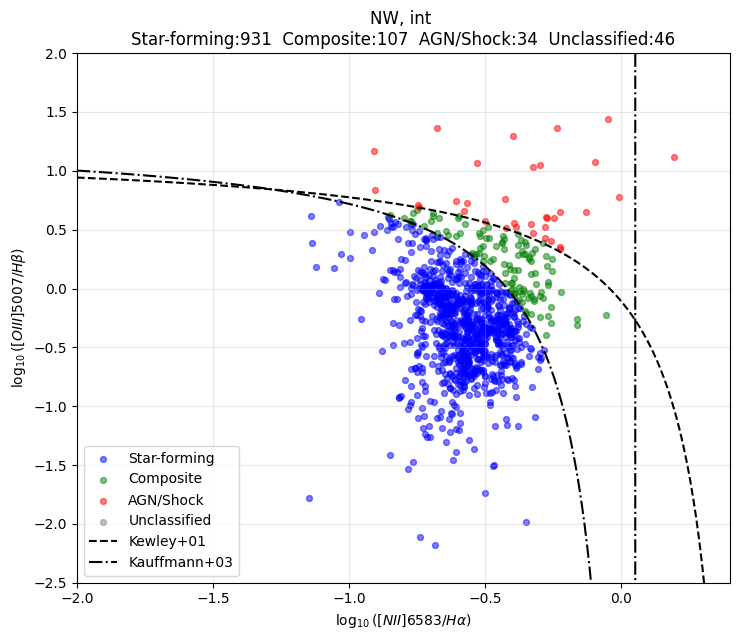

In [16]:
# Compute BPT points

prefix = 'int'
x_raw, y_raw = merged_df[f'log_NII_Ha_{prefix}_dered'].to_numpy(dtype=float), merged_df[f'log_OIII_Hb_{prefix}_dered'].to_numpy(dtype=float)
# x_bg,  y_bg  = bpt_xy(merged_df, use_bgsub=True)

# Demarcation curves (classic BPT)
x_curve = np.linspace(-2.0, 0.6, 600)
kewley = 0.61 / (x_curve - 0.47) + 1.19      # Kewley+2001
kauff  = 0.61 / (x_curve - 0.05) + 1.30      # Kauffmann+2003

# ---- Plot: overlay raw vs corrected in one figure ----
plt.figure(figsize=(7.5, 6.5))

classes = ["Star-forming", "Composite", "AGN/Shock", "Unclassified"]
colors = ['blue', 'green', 'red', 'grey']
for cls in classes:
    mask = (merged_df[f'BPT_class_{prefix}_dered'] == cls)
    plt.scatter(x_raw[mask], y_raw[mask], s=18, alpha=0.5, label=cls, color=colors[classes.index(cls)])
# #color by BPT class
# plt.scatter(x_raw[merged_df['raw_BPT_class'] == 'star-forming'], 
#             y_raw[merged_df['raw_BPT_class'] == 'star-forming'], s=18, alpha=0.5, label="Star-forming")
# # plt.scatter(x_bg,  y_bg,  s=18, alpha=0.5, label="Background-subtracted (edge threshold)")

plt.plot(x_curve, kewley, linestyle="--", label="Kewley+01", color = 'k')
plt.plot(x_curve, kauff,  linestyle="-.", label="Kauffmann+03", color = 'k')

plt.xlabel(r'$\log_{10}([NII]6583 / H\alpha)$')
plt.ylabel(r'$\log_{10}([OIII]5007 / H\beta)$')
plt.title(f"{field}, {prefix} \nStar-forming:{len(merged_df[merged_df[f'BPT_class_{prefix}_dered'] == 'Star-forming'])}  Composite:{len(merged_df[merged_df[f'BPT_class_{prefix}_dered'] == 'Composite'])}  AGN/Shock:{len(merged_df[merged_df[f'BPT_class_{prefix}_dered'] == 'AGN/Shock'])}  Unclassified:{len(merged_df[merged_df[f'BPT_class_{prefix}_dered'] == 'Unclassified'])}")

plt.xlim(-2, 0.4)
plt.ylim(-2.5, 2)
plt.grid(alpha=0.3)
plt.legend(frameon=True)
plt.tight_layout()
plt.savefig(os.path.join(figure_dir, f"BPT_{field}_{prefix}.png"), dpi=150)
plt.show()

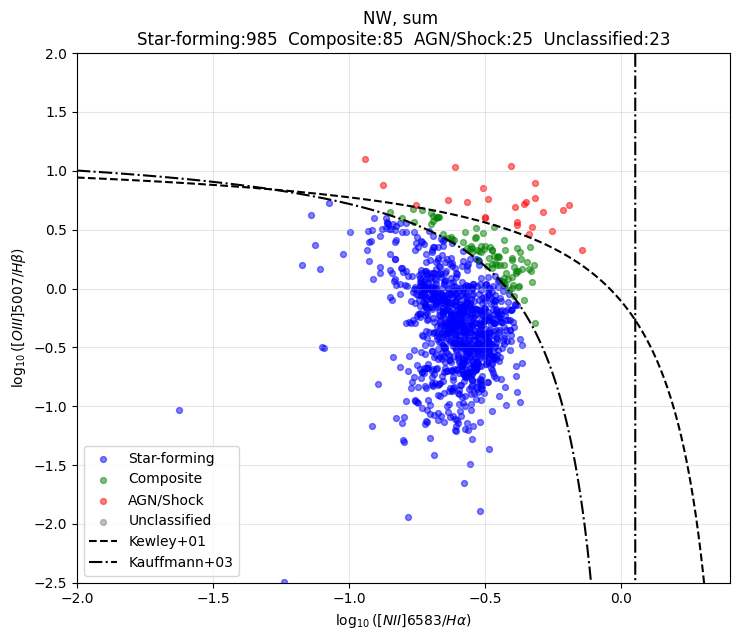

In [17]:
# Compute BPT points

prefix = 'sum'
x_raw, y_raw = merged_df[f'log_NII_Ha_{prefix}_dered'].to_numpy(dtype=float), merged_df[f'log_OIII_Hb_{prefix}_dered'].to_numpy(dtype=float)
# x_bg,  y_bg  = bpt_xy(merged_df, use_bgsub=True)

# Demarcation curves (classic BPT)
x_curve = np.linspace(-2.0, 0.6, 600)
kewley = 0.61 / (x_curve - 0.47) + 1.19      # Kewley+2001
kauff  = 0.61 / (x_curve - 0.05) + 1.30      # Kauffmann+2003

# ---- Plot: overlay raw vs corrected in one figure ----
plt.figure(figsize=(7.5, 6.5))

classes = ["Star-forming", "Composite", "AGN/Shock", "Unclassified"]
colors = ['blue', 'green', 'red', 'grey']
for cls in classes:
    mask = (merged_df[f'BPT_class_{prefix}_dered'] == cls)
    plt.scatter(x_raw[mask], y_raw[mask], s=18, alpha=0.5, label=cls, color=colors[classes.index(cls)])
# #color by BPT class
# plt.scatter(x_raw[merged_df['raw_BPT_class'] == 'star-forming'], 
#             y_raw[merged_df['raw_BPT_class'] == 'star-forming'], s=18, alpha=0.5, label="Star-forming")
# # plt.scatter(x_bg,  y_bg,  s=18, alpha=0.5, label="Background-subtracted (edge threshold)")

plt.plot(x_curve, kewley, linestyle="--", label="Kewley+01", color = 'k')
plt.plot(x_curve, kauff,  linestyle="-.", label="Kauffmann+03", color = 'k')

plt.xlabel(r'$\log_{10}([NII]6583 / H\alpha)$')
plt.ylabel(r'$\log_{10}([OIII]5007 / H\beta)$')
plt.title(f"{field}, {prefix} \nStar-forming:{len(merged_df[merged_df[f'BPT_class_{prefix}_dered'] == 'Star-forming'])}  Composite:{len(merged_df[merged_df[f'BPT_class_{prefix}_dered'] == 'Composite'])}  AGN/Shock:{len(merged_df[merged_df[f'BPT_class_{prefix}_dered'] == 'AGN/Shock'])}  Unclassified:{len(merged_df[merged_df[f'BPT_class_{prefix}_dered'] == 'Unclassified'])}")

plt.xlim(-2, 0.4)
plt.ylim(-2.5, 2)
plt.grid(alpha=0.3)
plt.legend(frameon=True)
plt.tight_layout()
plt.savefig(os.path.join(figure_dir, f"BPT_{field}_{prefix}.png"), dpi=150)
plt.show()

In [18]:
def plot_field_overlay_halpha_peaks_zoi_boundaries(
    catalog_df,
    ha_fits_path,
    zoi_label_map,
    boundary_label_map,
    field_name=None,
    x_col="x",
    y_col="y",
    region_label_col="zoi_center_label",
    region_id_col="region_id",
    xlim=None,
    ylim=None,
    show_peaks=True,
    show_zoi=True,
    show_boundaries=True,
    peaks_kwargs=None,
    zoi_color="cyan",
    boundary_color="magenta",
    zoi_lw=0.8,
    boundary_lw=1.1,
    alpha_zoi=0.65,
    alpha_boundary=0.9,
    # NEW: LogNorm controls
    ha_percentiles=(5, 99),         # global vmin/vmax percentiles (positive pixels only)
    use_local_lognorm=False,        # if True and xlim/ylim provided -> compute per-view norm
    local_percentiles=(3.0, 99.7),  # per-view percentiles (positive pixels only)
    min_pos_pixels=20,              # minimum positive pixels required to trust local percentiles
    eps_pos=None,                   # epsilon floor for vmin (defaults to nextafter(0,1))
    savepath=None,
    line = 'Halpha'
):
    """
    Overplot peaks + ZOI outlines + boundary outlines on the Halpha map, using LogNorm scaling.

    Parameters
    ----------
    catalog_df : pandas.DataFrame
        Must include x_col/y_col; should include region_label_col (integer ZOI label at center).
    ha_fits_path : str
        Path to Halpha FITS.
    zoi_label_map : 2D array
        Integer-labeled ZOI map (0 outside).
    boundary_label_map : 2D array
        Integer-labeled boundary map (0 outside).
    field_name : str
        Optional display name.
    xlim, ylim : (min,max) or None
        Plot limits in pixel coordinates.
    ha_percentiles : (lo, hi)
        Percentiles used for global LogNorm vmin/vmax (positive finite pixels only).
    use_local_lognorm : bool
        If True and xlim/ylim are given, compute per-view LogNorm using local_percentiles,
        falling back to global if too few positive pixels.
    """

    import numpy as np
    import matplotlib.pyplot as plt
    from astropy.io import fits
    from matplotlib.colors import LogNorm

    # Lazy import so this cell works even if skimage isn't installed elsewhere
    try:
        from skimage.segmentation import find_boundaries  # noqa: F401  (kept as in your original)
    except Exception as e:
        raise ImportError(
            "This plotting function requires scikit-image. "
            "Install with: pip install scikit-image"
        ) from e

    if eps_pos is None:
        eps_pos = np.nextafter(0, 1)

    # --- Field name ---
    if field_name is None:
        field_name = (
            str(catalog_df.get("field", ["Field"]).iloc[0])
            if hasattr(catalog_df, "iloc")
            else "Field"
        )

    # --- Load Halpha map ---
    ha = fits.getdata(ha_fits_path)
    ha = np.where(np.isfinite(ha), ha, np.nan)

    # --- Compute GLOBAL LogNorm vmin/vmax from positive finite pixels ---
    valid_pos = ha[np.isfinite(ha) & (ha > 0)]
    if valid_pos.size == 0:
        raise ValueError("Hα map has no positive finite values for LogNorm.")

    vmin_global = np.nanpercentile(valid_pos, ha_percentiles[0])
    vmax_global = np.nanpercentile(valid_pos, ha_percentiles[1])

    # Fallback if percentiles are degenerate
    if (not np.isfinite(vmin_global)) or (not np.isfinite(vmax_global)) or (vmax_global <= vmin_global):
        vmin_global, vmax_global = np.nanmin(valid_pos), np.nanmax(valid_pos)
        if (not np.isfinite(vmin_global)) or (not np.isfinite(vmax_global)) or (vmax_global <= vmin_global):
            raise ValueError("Failed to compute valid global vmin/vmax for Hα.")

    vmin_global = max(vmin_global, eps_pos)

    def _local_lognorm(arr2d):
        """Compute a per-view LogNorm using positive finite pixels, fallback to global."""
        pos = arr2d[np.isfinite(arr2d) & (arr2d > 0)]
        vmin_loc, vmax_loc = vmin_global, vmax_global

        if pos.size >= min_pos_pixels:
            lo = np.nanpercentile(pos, local_percentiles[0])
            hi = np.nanpercentile(pos, local_percentiles[1])
            if np.isfinite(lo) and np.isfinite(hi) and hi > lo:
                vmin_loc, vmax_loc = lo, hi

        vmin_loc = max(vmin_loc, eps_pos)
        if (not np.isfinite(vmax_loc)) or (vmax_loc <= vmin_loc):
            vmax_loc = vmin_loc * 1.01
        return LogNorm(vmin=vmin_loc, vmax=vmax_loc)

    # Decide norm: global or local-per-view
    norm = LogNorm(vmin=vmin_global, vmax=vmax_global)
    if use_local_lognorm and (xlim is not None) and (ylim is not None):
        # Clip indices safely and compute norm on that view
        x0, x1 = sorted([int(np.floor(xlim[0])), int(np.ceil(xlim[1]))])
        y0, y1 = sorted([int(np.floor(ylim[0])), int(np.ceil(ylim[1]))])
        x0 = max(0, x0); y0 = max(0, y0)
        x1 = min(ha.shape[1], x1); y1 = min(ha.shape[0], y1)
        view = ha[y0:y1, x0:x1]
        if view.size > 0:
            norm = _local_lognorm(view)

    # --- Ensure integer maps ---
    zoi_int = np.rint(np.nan_to_num(zoi_label_map, nan=0)).astype(np.int32)
    bnd_int = np.rint(np.nan_to_num(boundary_label_map, nan=0)).astype(np.int32)

    # --- Figure ---
    fig, ax = plt.subplots(figsize=(10, 10 * ha.shape[0] / ha.shape[1]))

    # Make NaNs white
    cmap_gray = plt.get_cmap("gray").copy()
    cmap_gray.set_bad(color="white")

    # IMPORTANT CHANGE: show ha (linear) with LogNorm (not log10(ha))
    im = ax.imshow(ha, origin="lower", cmap=cmap_gray, norm=norm)

    # --- Overlay outlines ---
    labels_from_catalog = None
    if hasattr(catalog_df, "columns") and (region_label_col in catalog_df.columns):
        labels_from_catalog = sorted({
            int(v) for v in catalog_df[region_label_col].values
            if np.isfinite(v) and int(v) > 0
        })

    if labels_from_catalog and len(labels_from_catalog) > 0:
        labels = labels_from_catalog
    else:
        labels = sorted([int(v) for v in np.unique(bnd_int) if v > 0])

    # NOTE: your original code contours the entire label maps at 0.5, which is fine.
    if show_zoi and np.isfinite(zoi_int).any():
        edge = np.nan_to_num(zoi_int, nan=0.0)
        ax.contour(edge, levels=[0.5], colors=[zoi_color], linewidths=zoi_lw,
                   origin="lower", zorder=1, alpha=alpha_zoi)
    if show_boundaries and np.isfinite(bnd_int).any():
        edge = np.nan_to_num(bnd_int, nan=0.0)
        ax.contour(edge, levels=[0.5], colors=[boundary_color], linewidths=boundary_lw,
                   origin="lower", zorder=1, alpha=alpha_boundary)

    # --- Plot peak centers ---
    if show_peaks:
        if peaks_kwargs is None:
            peaks_kwargs = dict(marker="+", s=18, linewidths=0.8, alpha=0.85)
        xs = catalog_df[x_col].astype(float).values
        ys = catalog_df[y_col].astype(float).values
        ax.scatter(xs, ys, color="k", **peaks_kwargs, label="Peaks")

    # --- Colorbar ---
    cbar = plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
    cbar.set_label(r"Flux (LogNorm)")

    # --- Aesthetics ---
    ax.set_title(f"{line} with Peaks, ZOI (cyan), Boundaries (magenta)")
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_facecolor("white")
    fig.patch.set_facecolor("white")

    # Limits
    if xlim is not None:
        ax.set_xlim(*xlim)
    if ylim is not None:
        ax.set_ylim(*ylim)

    if show_peaks:
        ax.legend(loc="upper right", frameon=True)

    plt.tight_layout()

    if savepath:
        plt.savefig(savepath, bbox_inches="tight", dpi=300, facecolor="white")
        print(f"[done] Saved overlay plot: {savepath}")

    plt.show()
    plt.close(fig)
    return fig, ax

Creating overlay plot for ha with peaks, ZOI, and boundaries; saving to: plots/individual_field_flux_plots/NW/M33_NW_ha_overlay.png


[done] Saved overlay plot: plots/individual_field_flux_plots/NW/M33_NW_ha_overlay.png


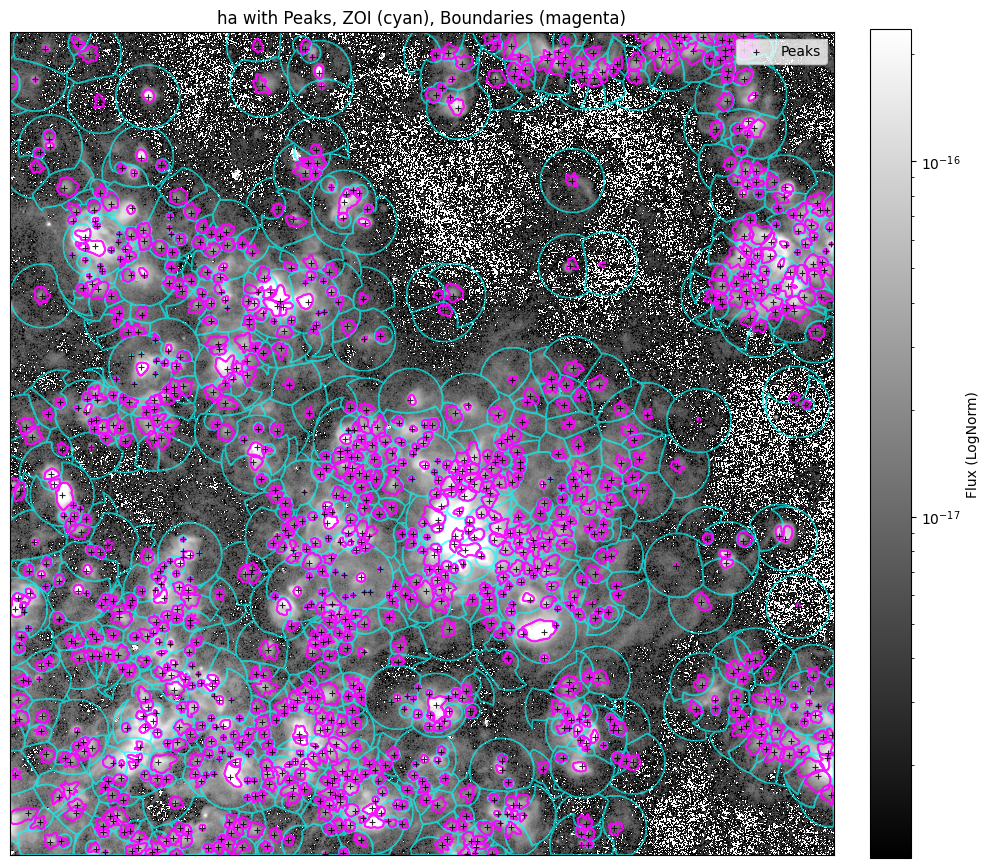

Creating overlay plot for hb with peaks, ZOI, and boundaries; saving to: plots/individual_field_flux_plots/NW/M33_NW_hb_overlay.png


[done] Saved overlay plot: plots/individual_field_flux_plots/NW/M33_NW_hb_overlay.png


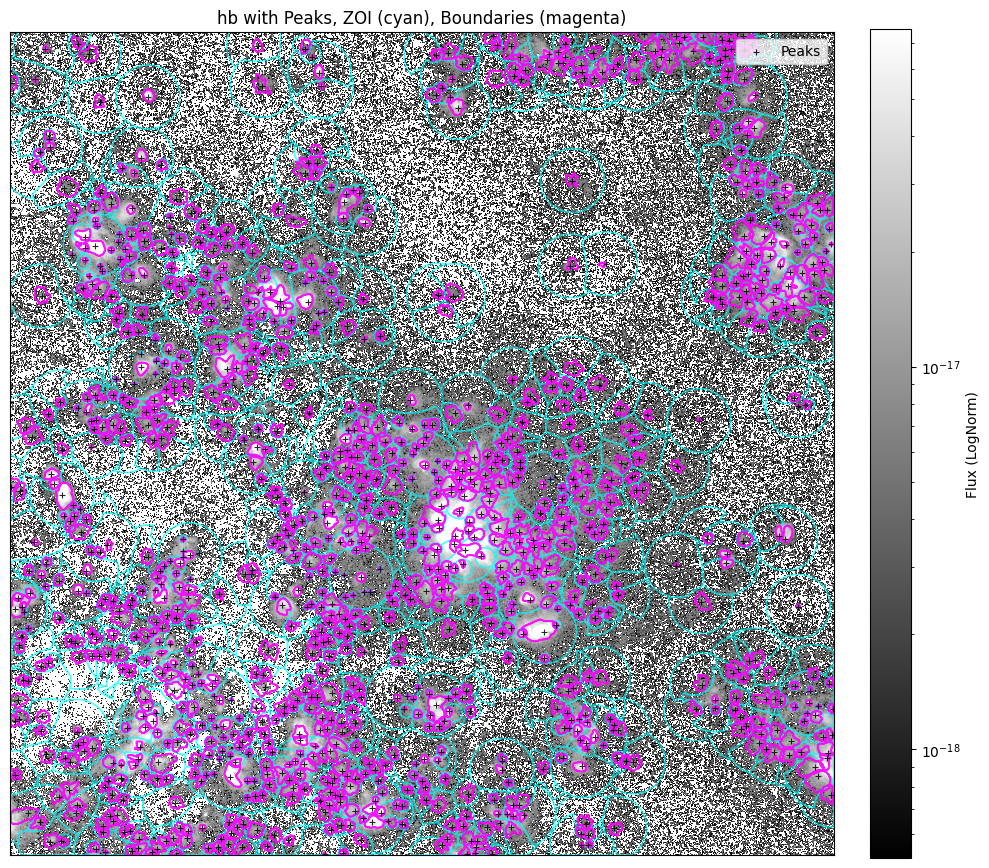

Creating overlay plot for oiii5007 with peaks, ZOI, and boundaries; saving to: plots/individual_field_flux_plots/NW/M33_NW_oiii5007_overlay.png


[done] Saved overlay plot: plots/individual_field_flux_plots/NW/M33_NW_oiii5007_overlay.png


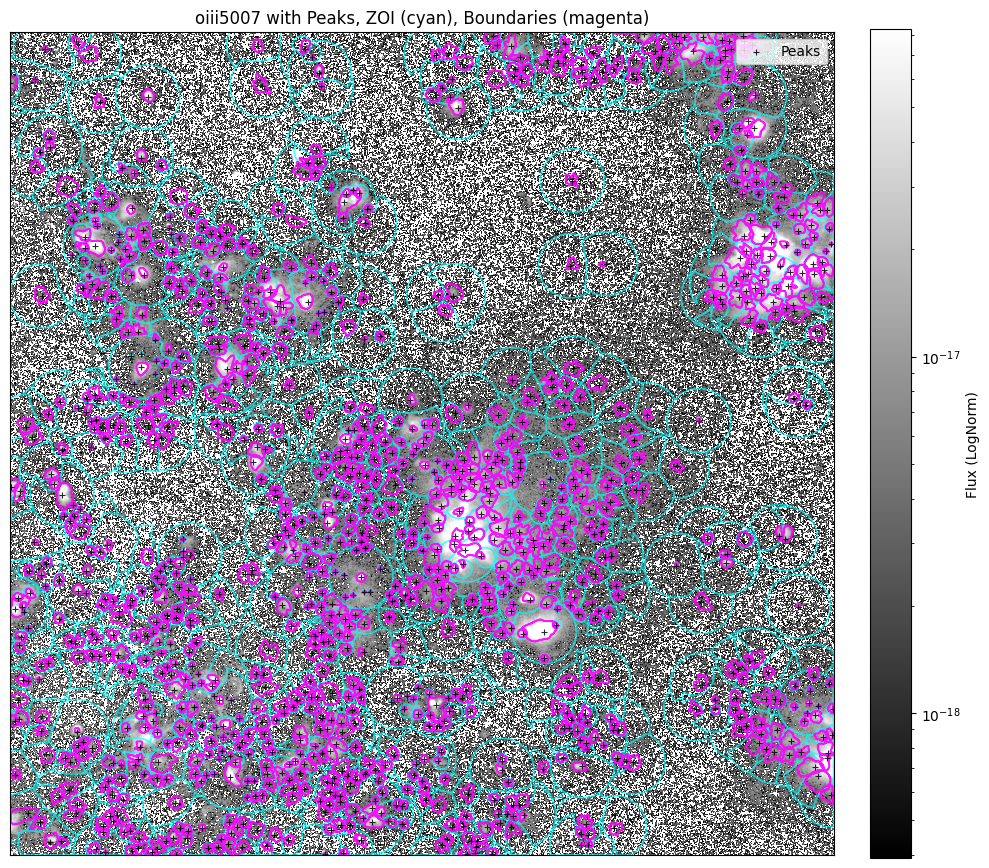

Creating overlay plot for sii6716 with peaks, ZOI, and boundaries; saving to: plots/individual_field_flux_plots/NW/M33_NW_sii6716_overlay.png


[done] Saved overlay plot: plots/individual_field_flux_plots/NW/M33_NW_sii6716_overlay.png


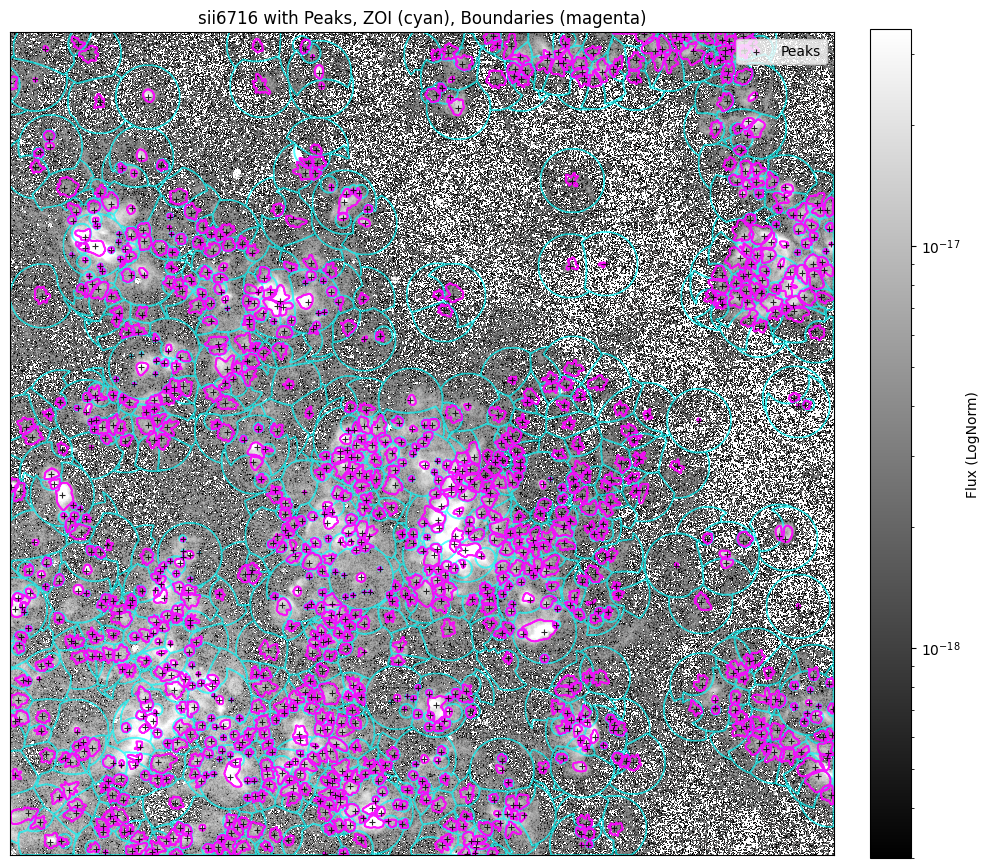

Creating overlay plot for sii6731 with peaks, ZOI, and boundaries; saving to: plots/individual_field_flux_plots/NW/M33_NW_sii6731_overlay.png


[done] Saved overlay plot: plots/individual_field_flux_plots/NW/M33_NW_sii6731_overlay.png


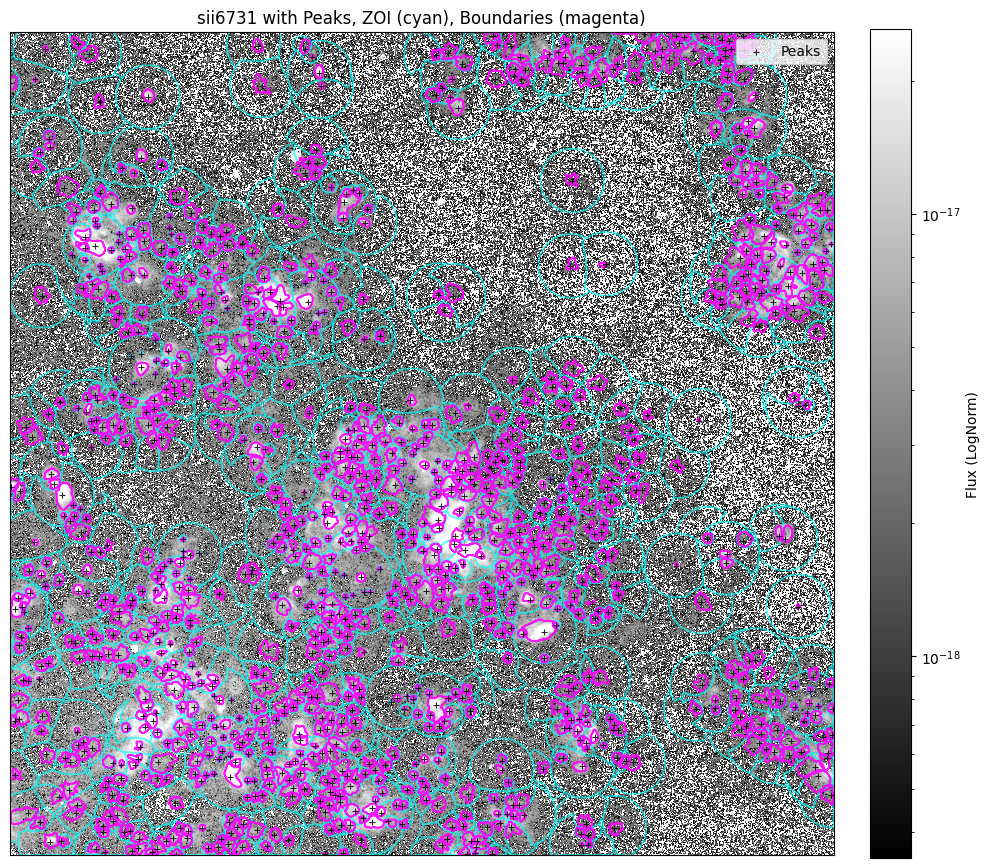

Creating overlay plot for nii6584 with peaks, ZOI, and boundaries; saving to: plots/individual_field_flux_plots/NW/M33_NW_nii6584_overlay.png


[done] Saved overlay plot: plots/individual_field_flux_plots/NW/M33_NW_nii6584_overlay.png


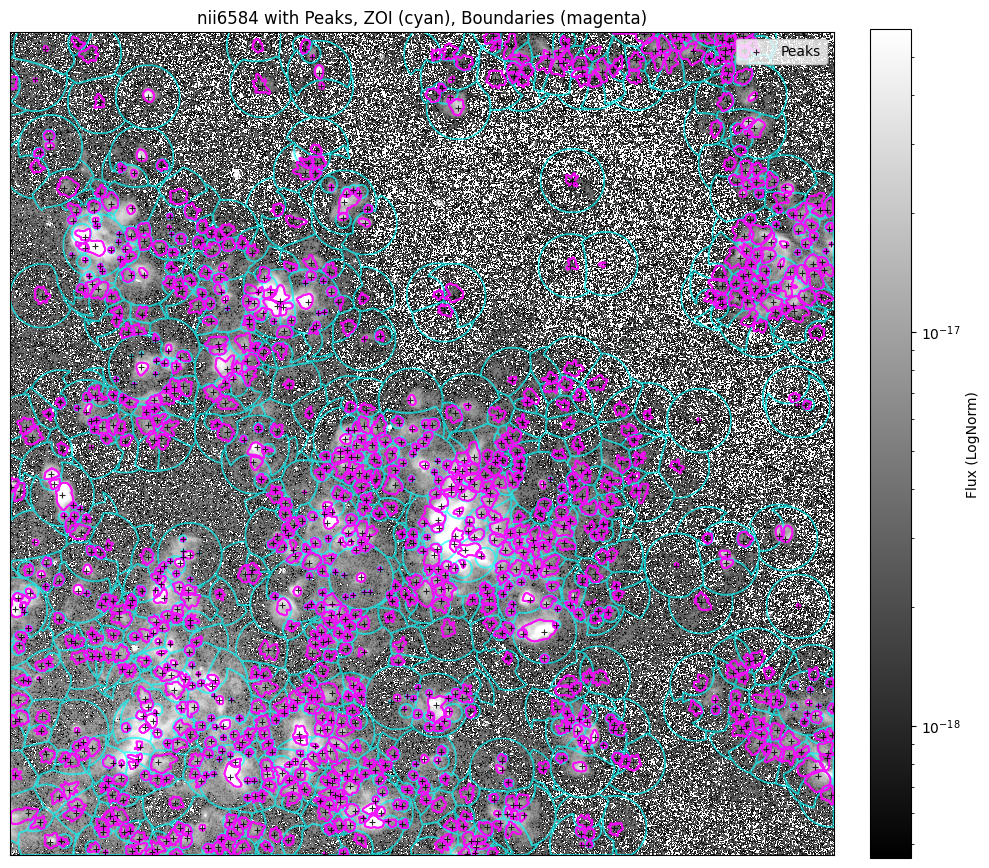

Creating overlay plot for oii3727 with peaks, ZOI, and boundaries; saving to: plots/individual_field_flux_plots/NW/M33_NW_oii3727_overlay.png


[done] Saved overlay plot: plots/individual_field_flux_plots/NW/M33_NW_oii3727_overlay.png


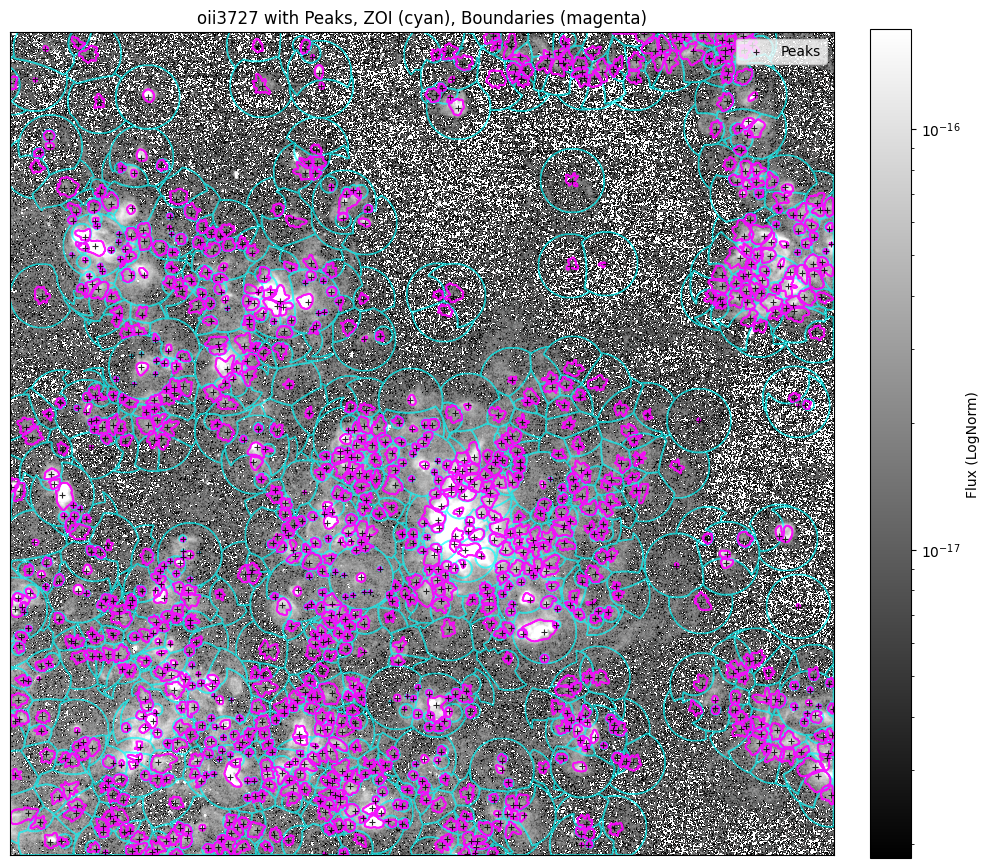

In [19]:
"""
Runs the full-field overlay plot using the variables created earlier in the notebook.
"""
# Example usage (matches your earlier variables):
# - combined: your peak catalog dataframe
# - halpha_fits: Halpha FITS path
# - zoi_label: ZOI label map (2D)
# - boundary_label: final boundary label map (2D)

# Optional: zoom limits (set to None to show full frame)
xlim = (50, 2000)
ylim = (50, 2000)

contzoi_fits = f"ZOI_maps/ZOI_map_{max_zoi}pc/ContZoI_map_{field}.fits"
contzoi_label = fits.getdata(contzoi_fits)
cont_map_fits = f"Boundary_maps/Boundary_map_100pc/ContDomain_map_{field}.fits"
cont_map = fits.getdata(cont_map_fits)

plot_maps_dir = f"plots/individual_field_flux_plots/{field}"
os.makedirs(plot_maps_dir, exist_ok=True)

for line in ["ha", "hb", "oiii5007", "sii6716", "sii6731", "nii6584", "oii3727"]:
    line_fits = f"{folder}M33{field}-{line}flux.fits"
    line_data = fits.getdata(line_fits)
    line_data = np.where(np.isfinite(line_data), line_data, np.nan)
    plot_overlay_path = f"{plot_maps_dir}/M33_{field}_{line}_overlay.png"
    print(f"Creating overlay plot for {line} with peaks, ZOI, and boundaries; saving to: {plot_overlay_path}")
    plot_field_overlay_halpha_peaks_zoi_boundaries(
        catalog_df=merged_df,
        ha_fits_path=line_fits,
        zoi_label_map=contzoi_label,
        boundary_label_map=cont_map,
        field_name=f"M33 {field}",
        x_col="x",
        y_col="y",
        region_label_col="zoi_center_label",
        xlim=xlim,
        ylim=ylim,
        show_peaks=True,
        show_zoi=True,
        show_boundaries=True,
        savepath=plot_overlay_path,
        line = line
    )